In [1]:
import numpy as np
from matplotlib import pyplot as plt
from tensorflow.keras import Sequential, Model
from tensorflow.keras.layers import Flatten, Dense, Input, Activation, Dropout, LeakyReLU, BatchNormalization, Reshape 
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import datasets

In [2]:
def build_discriminator(input_shape=(28, 28,), verbose=True):

    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Flatten())
    model.add(Dense(512))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(256))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(1, activation='sigmoid'))

    if verbose:
        model.summary()

    return model

In [3]:
def build_generator(z_dim=100, output_shape=(28, 28), verbose=True):

    model = Sequential()
    model.add(Input(shape=(z_dim,)))
    model.add(Dense(256, input_dim=z_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.3))
    model.add(Dense(512))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.3)) 
    model.add(Dense(1024))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.3))
    model.add(Dense(np.prod(output_shape), activation='tanh'))
    model.add(Reshape(output_shape))
    if verbose:
        model.summary()
    return model

In [5]:
def train(generator=None,discriminator=None,gan_model=None,epochs=1000, batch_size=128, sample_interval=50,z_dim=100):
    (X_train, _), (_, _) = datasets.fashion_mnist.load_data()
    X_train = X_train / 127.5 - 1
    real_y = np.ones((batch_size, 1))
    fake_y = np.zeros((batch_size, 1))

    for epoch in range(epochs):
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        real_imgs = X_train[idx]
        noise = np.random.normal(0, 1, (batch_size, z_dim))
        fake_imgs = generator.predict(noise)
        disc_loss_real = discriminator.train_on_batch(real_imgs, real_y)
        disc_loss_fake = discriminator.train_on_batch(fake_imgs, fake_y)
        discriminator_loss = 0.5 * np.add(disc_loss_real, disc_loss_fake)
        noise = np.random.normal(0, 1, (batch_size, z_dim))
        gen_loss = gan_model.train_on_batch(noise, real_y)
        print ("%d [Discriminator loss: %f, acc.: %.2f%%] [Generator loss: %f]" % (epoch, discriminator_loss[0], 100*discriminator_loss[1], gen_loss))
        if epoch % sample_interval == 0:
            sample_images(epoch,generator)


In [6]:
discriminator = build_discriminator()
discriminator.compile(loss='binary_crossentropy',optimizer=Adam(0.0002, 0.5),metrics=['accuracy'])


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 512)               401920    
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 1)                 257       
                                                                 
Total params: 533,505
Trainable params: 533,505
Non-trai

In [7]:
generator=build_generator()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 256)               25856     
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 256)               0         
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_4 (Dense)             (None, 512)               131584    
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 512)               0         
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 1024)             

In [9]:
# Noise for generator
z_dim = 100
z = Input(shape=(z_dim,))
img = generator(z)

# Fix the discriminator
discriminator.trainable = False

# Get discriminator output
validity = discriminator(img)

# Stack discriminator on top of generator
gan_model = Model(z, validity)
gan_model.compile(loss='binary_crossentropy', optimizer=Adam(0.0001, 0.5))
gan_model.summary()


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 100)]             0         
                                                                 
 sequential_1 (Sequential)   (None, 28, 28)            1486352   
                                                                 
 sequential (Sequential)     (None, 1)                 533505    
                                                                 
Total params: 2,019,857
Trainable params: 1,486,352
Non-trainable params: 533,505
_________________________________________________________________


In [10]:
def sample_images(epoch, generator, z_dim=100,
                  save_output=True,
                  output_dir="GAN_MNIST_Fashion_Genrated"):


    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, z_dim))
    gen_imgs = generator.predict(noise)

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5

    # get output shape
    output_shape = len(generator.output_shape)

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            if output_shape == 3:
                axs[i, j].imshow(gen_imgs[cnt, :, :], cmap='gray')
            else:
                axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            # if model_type == 'cgan':
            #     axs[i, j].set_title("Label: %d" % sampled_labels[cnt])
            axs[i, j].axis('off')
            cnt += 1
    plt.show()
    if save_output:
        fig.savefig("{}/{}.png".format(output_dir, epoch))
    plt.close()


1/1 [==============================] - 0s 120ms/step
0 [Discriminator loss: 0.296860, acc.: 93.75%] [Generator loss: 2.007788]
1/1 [==============================] - 0s 64ms/step


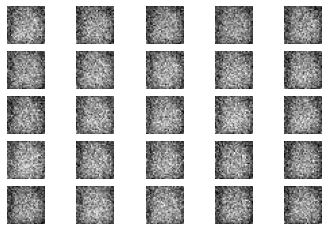

1/1 [==============================] - 0s 81ms/step
1 [Discriminator loss: 0.269844, acc.: 96.88%] [Generator loss: 2.090892]
1/1 [==============================] - 0s 64ms/step
2 [Discriminator loss: 0.187583, acc.: 100.00%] [Generator loss: 2.457118]
1/1 [==============================] - 0s 72ms/step
3 [Discriminator loss: 0.234528, acc.: 98.44%] [Generator loss: 2.311252]
1/1 [==============================] - 0s 88ms/step
4 [Discriminator loss: 0.227532, acc.: 98.44%] [Generator loss: 2.201823]
1/1 [==============================] - 0s 129ms/step
5 [Discriminator loss: 0.175546, acc.: 98.44%] [Generator loss: 2.405715]
1/1 [==============================] - 0s 105ms/step
6 [Discriminator loss: 0.173927, acc.: 98.44%] [Generator loss: 2.466262]
1/1 [==============================] - 0s 78ms/step
7 [Discriminator loss: 0.181981, acc.: 98.44%] [Generator loss: 2.570092]
1/1 [==============================] - 0s 64ms/step
8 [Discriminator loss: 0.255240, acc.: 96.88%] [Generator loss:

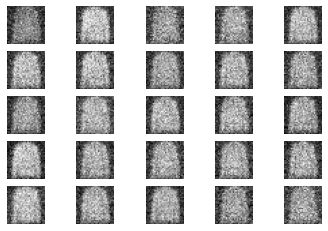

1/1 [==============================] - 0s 89ms/step
201 [Discriminator loss: 0.175813, acc.: 95.31%] [Generator loss: 3.226282]
1/1 [==============================] - 0s 87ms/step
202 [Discriminator loss: 0.085727, acc.: 96.88%] [Generator loss: 4.150069]
1/1 [==============================] - 0s 64ms/step
203 [Discriminator loss: 0.231595, acc.: 92.19%] [Generator loss: 3.185782]
1/1 [==============================] - 0s 56ms/step
204 [Discriminator loss: 0.167007, acc.: 95.31%] [Generator loss: 3.465930]
1/1 [==============================] - 0s 112ms/step
205 [Discriminator loss: 0.179045, acc.: 93.75%] [Generator loss: 3.316304]
1/1 [==============================] - 0s 72ms/step
206 [Discriminator loss: 0.090636, acc.: 100.00%] [Generator loss: 3.719455]
1/1 [==============================] - 0s 65ms/step
207 [Discriminator loss: 0.436357, acc.: 79.69%] [Generator loss: 2.985219]
1/1 [==============================] - 0s 65ms/step
208 [Discriminator loss: 0.156260, acc.: 96.88%] [

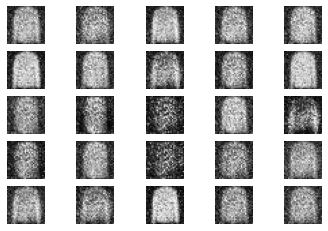

1/1 [==============================] - 0s 47ms/step
401 [Discriminator loss: 0.570953, acc.: 70.31%] [Generator loss: 3.625621]
1/1 [==============================] - 0s 62ms/step
402 [Discriminator loss: 0.130567, acc.: 95.31%] [Generator loss: 4.062897]
1/1 [==============================] - 0s 110ms/step
403 [Discriminator loss: 0.144750, acc.: 96.88%] [Generator loss: 3.397942]
1/1 [==============================] - 0s 62ms/step
404 [Discriminator loss: 0.223822, acc.: 93.75%] [Generator loss: 2.617852]
1/1 [==============================] - 0s 78ms/step
405 [Discriminator loss: 0.109774, acc.: 98.44%] [Generator loss: 3.494081]
1/1 [==============================] - 0s 69ms/step
406 [Discriminator loss: 0.182110, acc.: 96.88%] [Generator loss: 3.069516]
1/1 [==============================] - 0s 63ms/step
407 [Discriminator loss: 0.097174, acc.: 100.00%] [Generator loss: 3.459367]
1/1 [==============================] - 0s 62ms/step
408 [Discriminator loss: 0.622285, acc.: 71.88%] [

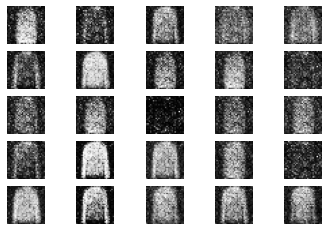

1/1 [==============================] - 0s 65ms/step
601 [Discriminator loss: 0.349735, acc.: 81.25%] [Generator loss: 3.709718]
1/1 [==============================] - 0s 63ms/step
602 [Discriminator loss: 0.170696, acc.: 92.19%] [Generator loss: 3.501834]
1/1 [==============================] - 0s 64ms/step
603 [Discriminator loss: 0.125240, acc.: 96.88%] [Generator loss: 3.539055]
1/1 [==============================] - 0s 54ms/step
604 [Discriminator loss: 0.220023, acc.: 90.62%] [Generator loss: 3.374017]
1/1 [==============================] - 0s 136ms/step
605 [Discriminator loss: 0.475631, acc.: 79.69%] [Generator loss: 3.048388]
1/1 [==============================] - 0s 54ms/step
606 [Discriminator loss: 0.056170, acc.: 100.00%] [Generator loss: 4.424711]
1/1 [==============================] - 0s 54ms/step
607 [Discriminator loss: 0.497359, acc.: 82.81%] [Generator loss: 2.571503]
1/1 [==============================] - 0s 62ms/step
608 [Discriminator loss: 0.398298, acc.: 81.25%] [

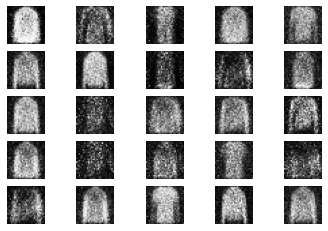

1/1 [==============================] - 0s 55ms/step
801 [Discriminator loss: 0.350407, acc.: 85.94%] [Generator loss: 2.547620]
1/1 [==============================] - 0s 72ms/step
802 [Discriminator loss: 0.346712, acc.: 89.06%] [Generator loss: 2.418071]
1/1 [==============================] - 0s 72ms/step
803 [Discriminator loss: 0.357860, acc.: 89.06%] [Generator loss: 2.634871]
1/1 [==============================] - 0s 56ms/step
804 [Discriminator loss: 0.401446, acc.: 78.12%] [Generator loss: 2.717047]
1/1 [==============================] - 0s 112ms/step
805 [Discriminator loss: 0.316500, acc.: 87.50%] [Generator loss: 2.670248]
1/1 [==============================] - 0s 72ms/step
806 [Discriminator loss: 0.360251, acc.: 84.38%] [Generator loss: 2.107811]
1/1 [==============================] - 0s 57ms/step
807 [Discriminator loss: 0.313725, acc.: 87.50%] [Generator loss: 2.212300]
1/1 [==============================] - 0s 58ms/step
808 [Discriminator loss: 0.291361, acc.: 90.62%] [G

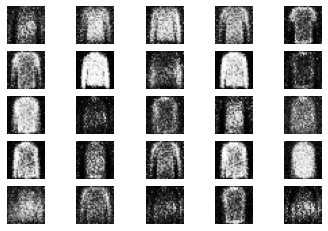

1/1 [==============================] - 0s 56ms/step
1001 [Discriminator loss: 0.320926, acc.: 89.06%] [Generator loss: 2.216121]
1/1 [==============================] - 0s 64ms/step
1002 [Discriminator loss: 0.265505, acc.: 90.62%] [Generator loss: 2.768170]
1/1 [==============================] - 0s 56ms/step
1003 [Discriminator loss: 0.279042, acc.: 92.19%] [Generator loss: 2.881737]
1/1 [==============================] - 0s 64ms/step
1004 [Discriminator loss: 0.237031, acc.: 90.62%] [Generator loss: 2.613002]
1/1 [==============================] - 0s 56ms/step
1005 [Discriminator loss: 0.385592, acc.: 81.25%] [Generator loss: 2.457358]
1/1 [==============================] - 0s 64ms/step
1006 [Discriminator loss: 0.283520, acc.: 89.06%] [Generator loss: 2.901671]
1/1 [==============================] - 0s 72ms/step
1007 [Discriminator loss: 0.338564, acc.: 85.94%] [Generator loss: 2.463656]
1/1 [==============================] - 0s 73ms/step
1008 [Discriminator loss: 0.574770, acc.: 64.

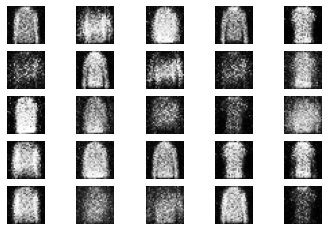

1/1 [==============================] - 0s 64ms/step
1201 [Discriminator loss: 0.393266, acc.: 82.81%] [Generator loss: 2.647909]
1/1 [==============================] - 0s 104ms/step
1202 [Discriminator loss: 0.356091, acc.: 82.81%] [Generator loss: 2.680329]
1/1 [==============================] - 0s 67ms/step
1203 [Discriminator loss: 0.464271, acc.: 76.56%] [Generator loss: 2.218784]
1/1 [==============================] - 0s 67ms/step
1204 [Discriminator loss: 0.277576, acc.: 89.06%] [Generator loss: 2.574550]
1/1 [==============================] - 0s 72ms/step
1205 [Discriminator loss: 0.328846, acc.: 87.50%] [Generator loss: 2.360439]
1/1 [==============================] - 0s 56ms/step
1206 [Discriminator loss: 0.279129, acc.: 90.62%] [Generator loss: 2.649062]
1/1 [==============================] - 0s 56ms/step
1207 [Discriminator loss: 0.386440, acc.: 81.25%] [Generator loss: 2.598113]
1/1 [==============================] - 0s 64ms/step
1208 [Discriminator loss: 0.261774, acc.: 93

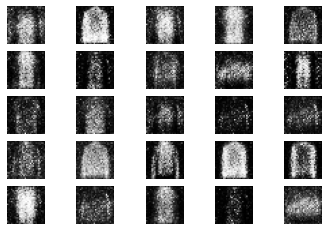

1/1 [==============================] - 0s 56ms/step
1401 [Discriminator loss: 0.184740, acc.: 95.31%] [Generator loss: 2.674611]
1/1 [==============================] - 0s 56ms/step
1402 [Discriminator loss: 0.415025, acc.: 75.00%] [Generator loss: 1.777350]
1/1 [==============================] - 0s 56ms/step
1403 [Discriminator loss: 0.369474, acc.: 79.69%] [Generator loss: 3.043488]
1/1 [==============================] - 0s 120ms/step
1404 [Discriminator loss: 0.330265, acc.: 84.38%] [Generator loss: 2.444295]
1/1 [==============================] - 0s 58ms/step
1405 [Discriminator loss: 0.354073, acc.: 84.38%] [Generator loss: 1.935050]
1/1 [==============================] - 0s 56ms/step
1406 [Discriminator loss: 0.217968, acc.: 95.31%] [Generator loss: 2.271861]
1/1 [==============================] - 0s 56ms/step
1407 [Discriminator loss: 0.169114, acc.: 96.88%] [Generator loss: 2.666717]
1/1 [==============================] - 0s 64ms/step
1408 [Discriminator loss: 0.340061, acc.: 87

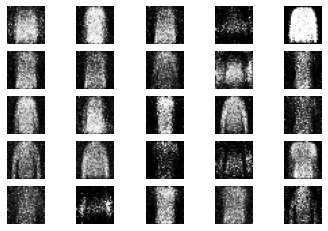

1/1 [==============================] - 0s 48ms/step
1601 [Discriminator loss: 0.261824, acc.: 92.19%] [Generator loss: 3.330373]
1/1 [==============================] - 0s 57ms/step
1602 [Discriminator loss: 0.326123, acc.: 85.94%] [Generator loss: 2.871174]
1/1 [==============================] - 0s 64ms/step
1603 [Discriminator loss: 0.421189, acc.: 85.94%] [Generator loss: 2.099483]
1/1 [==============================] - 0s 60ms/step
1604 [Discriminator loss: 0.314468, acc.: 89.06%] [Generator loss: 2.480196]
1/1 [==============================] - 0s 130ms/step
1605 [Discriminator loss: 0.320724, acc.: 87.50%] [Generator loss: 2.399337]
1/1 [==============================] - 0s 57ms/step
1606 [Discriminator loss: 0.259635, acc.: 93.75%] [Generator loss: 2.528708]
1/1 [==============================] - 0s 49ms/step
1607 [Discriminator loss: 0.282570, acc.: 90.62%] [Generator loss: 2.835948]
1/1 [==============================] - 0s 65ms/step
1608 [Discriminator loss: 0.301438, acc.: 87

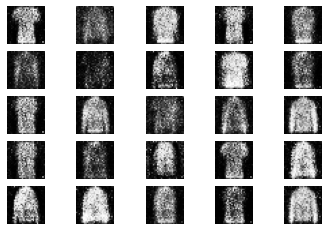

1/1 [==============================] - 0s 49ms/step
1801 [Discriminator loss: 0.305255, acc.: 90.62%] [Generator loss: 2.770965]
1/1 [==============================] - 0s 54ms/step
1802 [Discriminator loss: 0.322633, acc.: 84.38%] [Generator loss: 2.509297]
1/1 [==============================] - 0s 72ms/step
1803 [Discriminator loss: 0.255381, acc.: 90.62%] [Generator loss: 2.998545]
1/1 [==============================] - 0s 67ms/step
1804 [Discriminator loss: 0.301921, acc.: 89.06%] [Generator loss: 2.259520]
1/1 [==============================] - 0s 88ms/step
1805 [Discriminator loss: 0.239836, acc.: 90.62%] [Generator loss: 2.718176]
1/1 [==============================] - 0s 99ms/step
1806 [Discriminator loss: 0.536988, acc.: 73.44%] [Generator loss: 2.497789]
1/1 [==============================] - 0s 64ms/step
1807 [Discriminator loss: 0.270545, acc.: 87.50%] [Generator loss: 3.149383]
1/1 [==============================] - 0s 64ms/step
1808 [Discriminator loss: 0.322475, acc.: 87.

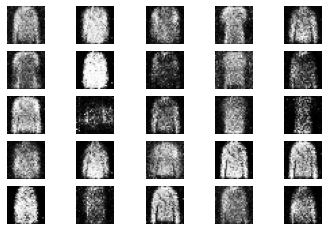

1/1 [==============================] - 0s 54ms/step
2001 [Discriminator loss: 0.319376, acc.: 89.06%] [Generator loss: 2.345171]
1/1 [==============================] - 0s 64ms/step
2002 [Discriminator loss: 0.325948, acc.: 82.81%] [Generator loss: 2.683796]
1/1 [==============================] - 0s 62ms/step
2003 [Discriminator loss: 0.413217, acc.: 78.12%] [Generator loss: 2.516815]
1/1 [==============================] - 0s 56ms/step
2004 [Discriminator loss: 0.320278, acc.: 81.25%] [Generator loss: 2.724684]
1/1 [==============================] - 0s 133ms/step
2005 [Discriminator loss: 0.340771, acc.: 87.50%] [Generator loss: 1.937273]
1/1 [==============================] - 0s 56ms/step
2006 [Discriminator loss: 0.408242, acc.: 79.69%] [Generator loss: 2.275896]
1/1 [==============================] - 0s 64ms/step
2007 [Discriminator loss: 0.215815, acc.: 92.19%] [Generator loss: 2.709666]
1/1 [==============================] - 0s 100ms/step
2008 [Discriminator loss: 0.305515, acc.: 8

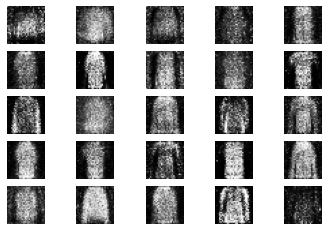

1/1 [==============================] - 0s 51ms/step
2201 [Discriminator loss: 0.381125, acc.: 87.50%] [Generator loss: 2.415550]
1/1 [==============================] - 0s 64ms/step
2202 [Discriminator loss: 0.328334, acc.: 85.94%] [Generator loss: 2.370870]
1/1 [==============================] - 0s 64ms/step
2203 [Discriminator loss: 0.398178, acc.: 82.81%] [Generator loss: 2.257267]
1/1 [==============================] - 0s 56ms/step
2204 [Discriminator loss: 0.471096, acc.: 79.69%] [Generator loss: 2.005095]
1/1 [==============================] - 0s 113ms/step
2205 [Discriminator loss: 0.276667, acc.: 92.19%] [Generator loss: 2.440426]
1/1 [==============================] - 0s 48ms/step
2206 [Discriminator loss: 0.529006, acc.: 71.88%] [Generator loss: 2.610080]
1/1 [==============================] - 0s 49ms/step
2207 [Discriminator loss: 0.397514, acc.: 81.25%] [Generator loss: 2.376870]
1/1 [==============================] - 0s 57ms/step
2208 [Discriminator loss: 0.470563, acc.: 71

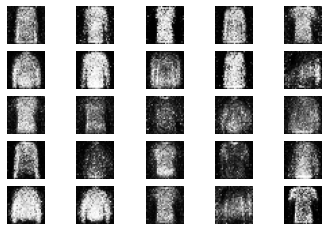

1/1 [==============================] - 0s 48ms/step
2401 [Discriminator loss: 0.302759, acc.: 93.75%] [Generator loss: 2.247706]
1/1 [==============================] - 0s 56ms/step
2402 [Discriminator loss: 0.473591, acc.: 84.38%] [Generator loss: 1.930062]
1/1 [==============================] - 0s 64ms/step
2403 [Discriminator loss: 0.311519, acc.: 89.06%] [Generator loss: 2.318108]
1/1 [==============================] - 0s 54ms/step
2404 [Discriminator loss: 0.407128, acc.: 82.81%] [Generator loss: 2.191298]
1/1 [==============================] - 0s 133ms/step
2405 [Discriminator loss: 0.411523, acc.: 85.94%] [Generator loss: 2.238228]
1/1 [==============================] - 0s 56ms/step
2406 [Discriminator loss: 0.330879, acc.: 87.50%] [Generator loss: 2.506021]
1/1 [==============================] - 0s 56ms/step
2407 [Discriminator loss: 0.443818, acc.: 76.56%] [Generator loss: 2.173337]
1/1 [==============================] - 0s 56ms/step
2408 [Discriminator loss: 0.336728, acc.: 82

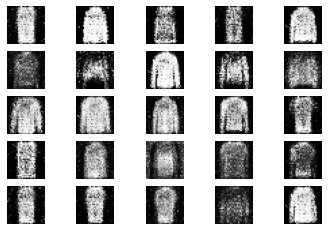

1/1 [==============================] - 0s 58ms/step
2601 [Discriminator loss: 0.432466, acc.: 78.12%] [Generator loss: 2.638572]
1/1 [==============================] - 0s 64ms/step
2602 [Discriminator loss: 0.241317, acc.: 90.62%] [Generator loss: 3.155254]
1/1 [==============================] - 0s 72ms/step
2603 [Discriminator loss: 0.289865, acc.: 84.38%] [Generator loss: 2.594747]
1/1 [==============================] - 0s 56ms/step
2604 [Discriminator loss: 0.310485, acc.: 87.50%] [Generator loss: 2.110890]
1/1 [==============================] - 0s 89ms/step
2605 [Discriminator loss: 0.525077, acc.: 76.56%] [Generator loss: 1.937104]
1/1 [==============================] - 0s 64ms/step
2606 [Discriminator loss: 0.234642, acc.: 95.31%] [Generator loss: 2.707618]
1/1 [==============================] - 0s 81ms/step
2607 [Discriminator loss: 0.429381, acc.: 87.50%] [Generator loss: 2.463230]
1/1 [==============================] - 0s 62ms/step
2608 [Discriminator loss: 0.493384, acc.: 78.

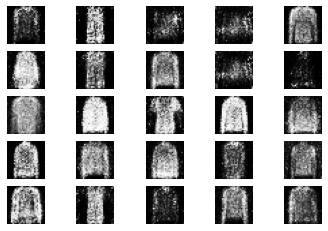

1/1 [==============================] - 0s 72ms/step
2801 [Discriminator loss: 0.343207, acc.: 90.62%] [Generator loss: 2.248550]
1/1 [==============================] - 0s 64ms/step
2802 [Discriminator loss: 0.346179, acc.: 89.06%] [Generator loss: 2.037348]
1/1 [==============================] - 0s 65ms/step
2803 [Discriminator loss: 0.357504, acc.: 84.38%] [Generator loss: 2.140709]
1/1 [==============================] - 0s 62ms/step
2804 [Discriminator loss: 0.284423, acc.: 85.94%] [Generator loss: 2.241919]
1/1 [==============================] - 0s 66ms/step
2805 [Discriminator loss: 0.586363, acc.: 71.88%] [Generator loss: 1.796068]
1/1 [==============================] - 0s 80ms/step
2806 [Discriminator loss: 0.441272, acc.: 84.38%] [Generator loss: 2.696730]
1/1 [==============================] - 0s 62ms/step
2807 [Discriminator loss: 0.324042, acc.: 87.50%] [Generator loss: 1.925505]
1/1 [==============================] - 0s 65ms/step
2808 [Discriminator loss: 0.346801, acc.: 82.

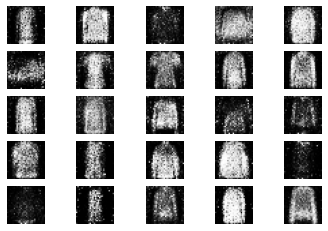

1/1 [==============================] - 0s 115ms/step
3001 [Discriminator loss: 0.214927, acc.: 95.31%] [Generator loss: 2.393950]
1/1 [==============================] - 0s 111ms/step
3002 [Discriminator loss: 0.384582, acc.: 84.38%] [Generator loss: 2.012719]
1/1 [==============================] - 0s 84ms/step
3003 [Discriminator loss: 0.426107, acc.: 82.81%] [Generator loss: 2.095356]
1/1 [==============================] - 0s 74ms/step
3004 [Discriminator loss: 0.276889, acc.: 90.62%] [Generator loss: 2.556842]
1/1 [==============================] - 0s 69ms/step
3005 [Discriminator loss: 0.360006, acc.: 85.94%] [Generator loss: 2.252063]
1/1 [==============================] - 0s 74ms/step
3006 [Discriminator loss: 0.355468, acc.: 84.38%] [Generator loss: 2.401038]
1/1 [==============================] - 0s 88ms/step
3007 [Discriminator loss: 0.328945, acc.: 85.94%] [Generator loss: 2.397530]
1/1 [==============================] - 0s 93ms/step
3008 [Discriminator loss: 0.370138, acc.: 8

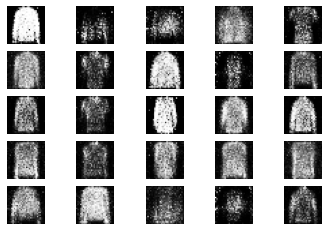

1/1 [==============================] - 0s 73ms/step
3201 [Discriminator loss: 0.294215, acc.: 81.25%] [Generator loss: 2.683562]
1/1 [==============================] - 0s 107ms/step
3202 [Discriminator loss: 0.430726, acc.: 76.56%] [Generator loss: 2.703620]
1/1 [==============================] - 0s 75ms/step
3203 [Discriminator loss: 0.241247, acc.: 95.31%] [Generator loss: 2.254403]
1/1 [==============================] - 0s 105ms/step
3204 [Discriminator loss: 0.441885, acc.: 79.69%] [Generator loss: 2.291144]
1/1 [==============================] - 0s 65ms/step
3205 [Discriminator loss: 0.388627, acc.: 84.38%] [Generator loss: 2.422393]
1/1 [==============================] - 0s 74ms/step
3206 [Discriminator loss: 0.270373, acc.: 89.06%] [Generator loss: 2.775808]
1/1 [==============================] - 0s 77ms/step
3207 [Discriminator loss: 0.259988, acc.: 90.62%] [Generator loss: 2.506503]
1/1 [==============================] - 0s 77ms/step
3208 [Discriminator loss: 0.417845, acc.: 8

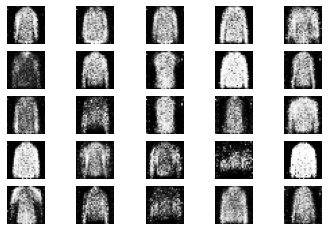

1/1 [==============================] - 0s 90ms/step
3401 [Discriminator loss: 0.538721, acc.: 75.00%] [Generator loss: 2.399564]
1/1 [==============================] - 0s 150ms/step
3402 [Discriminator loss: 0.474563, acc.: 75.00%] [Generator loss: 2.382881]
1/1 [==============================] - 0s 181ms/step
3403 [Discriminator loss: 0.432109, acc.: 79.69%] [Generator loss: 2.045672]
1/1 [==============================] - 0s 89ms/step
3404 [Discriminator loss: 0.312117, acc.: 89.06%] [Generator loss: 2.102458]
1/1 [==============================] - 0s 106ms/step
3405 [Discriminator loss: 0.429765, acc.: 82.81%] [Generator loss: 2.018389]
1/1 [==============================] - 0s 88ms/step
3406 [Discriminator loss: 0.493377, acc.: 75.00%] [Generator loss: 2.053641]
1/1 [==============================] - 0s 110ms/step
3407 [Discriminator loss: 0.383808, acc.: 82.81%] [Generator loss: 2.265944]
1/1 [==============================] - 0s 83ms/step
3408 [Discriminator loss: 0.555245, acc.:

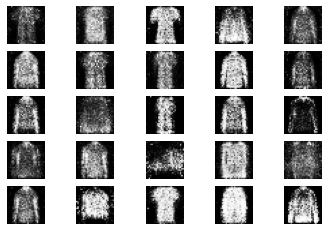

1/1 [==============================] - 0s 69ms/step
3601 [Discriminator loss: 0.407970, acc.: 81.25%] [Generator loss: 1.579148]
1/1 [==============================] - 0s 63ms/step
3602 [Discriminator loss: 0.550661, acc.: 73.44%] [Generator loss: 1.772387]
1/1 [==============================] - 0s 64ms/step
3603 [Discriminator loss: 0.403068, acc.: 82.81%] [Generator loss: 1.987723]
1/1 [==============================] - 0s 111ms/step
3604 [Discriminator loss: 0.586337, acc.: 75.00%] [Generator loss: 1.816377]
1/1 [==============================] - 0s 66ms/step
3605 [Discriminator loss: 0.397269, acc.: 81.25%] [Generator loss: 2.102691]
1/1 [==============================] - 0s 65ms/step
3606 [Discriminator loss: 0.402536, acc.: 78.12%] [Generator loss: 2.026459]
1/1 [==============================] - 0s 77ms/step
3607 [Discriminator loss: 0.418696, acc.: 81.25%] [Generator loss: 1.876235]
1/1 [==============================] - 0s 70ms/step
3608 [Discriminator loss: 0.446103, acc.: 78

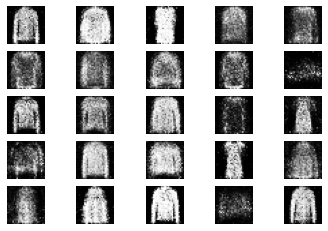

1/1 [==============================] - 0s 101ms/step
3801 [Discriminator loss: 0.369556, acc.: 84.38%] [Generator loss: 2.103968]
1/1 [==============================] - 0s 83ms/step
3802 [Discriminator loss: 0.453782, acc.: 78.12%] [Generator loss: 1.969896]
1/1 [==============================] - 0s 163ms/step
3803 [Discriminator loss: 0.420686, acc.: 82.81%] [Generator loss: 1.536660]
1/1 [==============================] - 0s 101ms/step
3804 [Discriminator loss: 0.400280, acc.: 82.81%] [Generator loss: 2.043278]
1/1 [==============================] - 0s 89ms/step
3805 [Discriminator loss: 0.399231, acc.: 85.94%] [Generator loss: 2.003902]
1/1 [==============================] - 0s 74ms/step
3806 [Discriminator loss: 0.333927, acc.: 87.50%] [Generator loss: 1.863590]
1/1 [==============================] - 0s 73ms/step
3807 [Discriminator loss: 0.340719, acc.: 85.94%] [Generator loss: 2.270508]
1/1 [==============================] - 0s 83ms/step
3808 [Discriminator loss: 0.314963, acc.: 

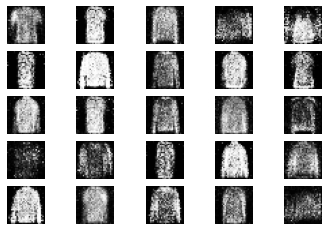

1/1 [==============================] - 0s 110ms/step
4001 [Discriminator loss: 0.571671, acc.: 68.75%] [Generator loss: 1.845794]
1/1 [==============================] - 0s 95ms/step
4002 [Discriminator loss: 0.472380, acc.: 71.88%] [Generator loss: 1.728783]
1/1 [==============================] - 0s 199ms/step
4003 [Discriminator loss: 0.411691, acc.: 79.69%] [Generator loss: 2.227813]
1/1 [==============================] - 0s 90ms/step
4004 [Discriminator loss: 0.397327, acc.: 79.69%] [Generator loss: 1.919176]
1/1 [==============================] - 0s 75ms/step
4005 [Discriminator loss: 0.434886, acc.: 81.25%] [Generator loss: 1.754070]
1/1 [==============================] - 0s 68ms/step
4006 [Discriminator loss: 0.423076, acc.: 79.69%] [Generator loss: 1.960772]
1/1 [==============================] - 0s 68ms/step
4007 [Discriminator loss: 0.336702, acc.: 92.19%] [Generator loss: 1.990963]
1/1 [==============================] - 0s 76ms/step
4008 [Discriminator loss: 0.457534, acc.: 7

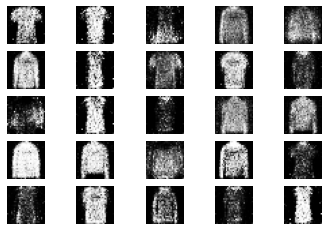

1/1 [==============================] - 0s 68ms/step
4201 [Discriminator loss: 0.340907, acc.: 84.38%] [Generator loss: 2.000449]
1/1 [==============================] - 0s 66ms/step
4202 [Discriminator loss: 0.447691, acc.: 81.25%] [Generator loss: 2.121018]
1/1 [==============================] - 0s 65ms/step
4203 [Discriminator loss: 0.357379, acc.: 84.38%] [Generator loss: 2.084983]
1/1 [==============================] - 0s 68ms/step
4204 [Discriminator loss: 0.285889, acc.: 89.06%] [Generator loss: 2.165770]
1/1 [==============================] - 0s 66ms/step
4205 [Discriminator loss: 0.404669, acc.: 82.81%] [Generator loss: 1.816865]
1/1 [==============================] - 0s 72ms/step
4206 [Discriminator loss: 0.503997, acc.: 73.44%] [Generator loss: 1.656609]
1/1 [==============================] - 0s 68ms/step
4207 [Discriminator loss: 0.407562, acc.: 78.12%] [Generator loss: 1.844812]
1/1 [==============================] - 0s 66ms/step
4208 [Discriminator loss: 0.440691, acc.: 85.

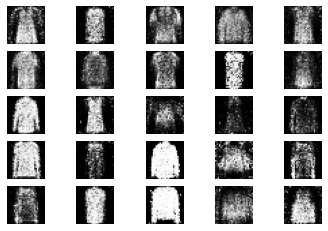

1/1 [==============================] - 0s 78ms/step
4401 [Discriminator loss: 0.384293, acc.: 85.94%] [Generator loss: 2.034350]
1/1 [==============================] - 0s 73ms/step
4402 [Discriminator loss: 0.437050, acc.: 78.12%] [Generator loss: 1.904707]
1/1 [==============================] - 0s 80ms/step
4403 [Discriminator loss: 0.617023, acc.: 62.50%] [Generator loss: 1.591488]
1/1 [==============================] - 0s 69ms/step
4404 [Discriminator loss: 0.417705, acc.: 81.25%] [Generator loss: 1.735161]
1/1 [==============================] - 0s 69ms/step
4405 [Discriminator loss: 0.364637, acc.: 81.25%] [Generator loss: 1.789120]
1/1 [==============================] - 0s 100ms/step
4406 [Discriminator loss: 0.479973, acc.: 78.12%] [Generator loss: 1.805028]
1/1 [==============================] - 0s 85ms/step
4407 [Discriminator loss: 0.323331, acc.: 89.06%] [Generator loss: 1.875877]
1/1 [==============================] - 0s 79ms/step
4408 [Discriminator loss: 0.410608, acc.: 82

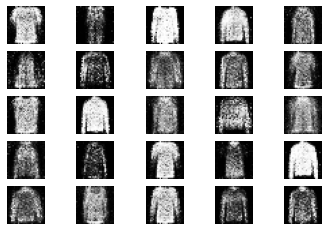

1/1 [==============================] - 0s 80ms/step
4601 [Discriminator loss: 0.535205, acc.: 75.00%] [Generator loss: 1.931785]
1/1 [==============================] - 0s 73ms/step
4602 [Discriminator loss: 0.288616, acc.: 87.50%] [Generator loss: 2.078703]
1/1 [==============================] - 0s 85ms/step
4603 [Discriminator loss: 0.655118, acc.: 64.06%] [Generator loss: 1.720614]
1/1 [==============================] - 0s 95ms/step
4604 [Discriminator loss: 0.360296, acc.: 84.38%] [Generator loss: 2.108648]
1/1 [==============================] - 0s 95ms/step
4605 [Discriminator loss: 0.457214, acc.: 81.25%] [Generator loss: 1.689336]
1/1 [==============================] - 0s 86ms/step
4606 [Discriminator loss: 0.411452, acc.: 79.69%] [Generator loss: 1.889458]
1/1 [==============================] - 0s 89ms/step
4607 [Discriminator loss: 0.341850, acc.: 90.62%] [Generator loss: 1.789402]
1/1 [==============================] - 0s 82ms/step
4608 [Discriminator loss: 0.483233, acc.: 75.

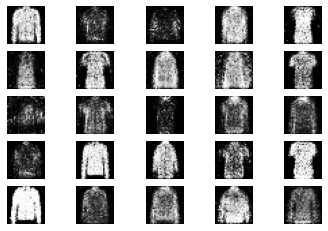

1/1 [==============================] - 0s 75ms/step
4801 [Discriminator loss: 0.662937, acc.: 60.94%] [Generator loss: 1.789674]
1/1 [==============================] - 0s 73ms/step
4802 [Discriminator loss: 0.343199, acc.: 81.25%] [Generator loss: 2.042969]
1/1 [==============================] - 0s 73ms/step
4803 [Discriminator loss: 0.393489, acc.: 85.94%] [Generator loss: 2.053843]
1/1 [==============================] - 0s 73ms/step
4804 [Discriminator loss: 0.633241, acc.: 65.62%] [Generator loss: 1.775121]
1/1 [==============================] - 0s 80ms/step
4805 [Discriminator loss: 0.615857, acc.: 68.75%] [Generator loss: 1.926562]
1/1 [==============================] - 0s 76ms/step
4806 [Discriminator loss: 0.425328, acc.: 76.56%] [Generator loss: 1.926009]
1/1 [==============================] - 0s 68ms/step
4807 [Discriminator loss: 0.497338, acc.: 79.69%] [Generator loss: 1.802214]
1/1 [==============================] - 0s 70ms/step
4808 [Discriminator loss: 0.252096, acc.: 90.

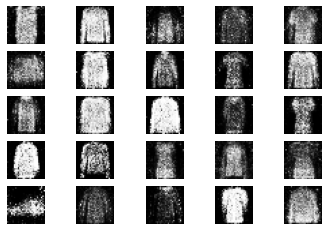

1/1 [==============================] - 0s 99ms/step
5001 [Discriminator loss: 0.443267, acc.: 82.81%] [Generator loss: 1.814666]
1/1 [==============================] - 0s 80ms/step
5002 [Discriminator loss: 0.363374, acc.: 89.06%] [Generator loss: 1.909623]
1/1 [==============================] - 0s 112ms/step
5003 [Discriminator loss: 0.305394, acc.: 90.62%] [Generator loss: 1.830516]
1/1 [==============================] - 0s 75ms/step
5004 [Discriminator loss: 0.349673, acc.: 89.06%] [Generator loss: 1.739059]
1/1 [==============================] - 0s 82ms/step
5005 [Discriminator loss: 0.414054, acc.: 78.12%] [Generator loss: 1.799918]
1/1 [==============================] - 0s 75ms/step
5006 [Discriminator loss: 0.465036, acc.: 78.12%] [Generator loss: 1.988658]
1/1 [==============================] - 0s 70ms/step
5007 [Discriminator loss: 0.336473, acc.: 82.81%] [Generator loss: 1.977535]
1/1 [==============================] - 0s 79ms/step
5008 [Discriminator loss: 0.436108, acc.: 73

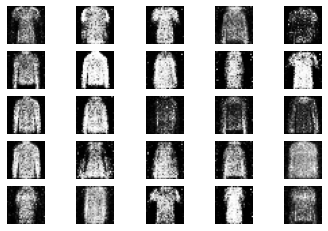

1/1 [==============================] - 0s 71ms/step
5201 [Discriminator loss: 0.457473, acc.: 76.56%] [Generator loss: 1.917672]
1/1 [==============================] - 0s 80ms/step
5202 [Discriminator loss: 0.306496, acc.: 87.50%] [Generator loss: 2.023448]
1/1 [==============================] - 0s 81ms/step
5203 [Discriminator loss: 0.467414, acc.: 71.88%] [Generator loss: 2.216833]
1/1 [==============================] - 0s 72ms/step
5204 [Discriminator loss: 0.308205, acc.: 89.06%] [Generator loss: 1.869588]
1/1 [==============================] - 0s 86ms/step
5205 [Discriminator loss: 0.493006, acc.: 76.56%] [Generator loss: 1.165120]
1/1 [==============================] - 0s 74ms/step
5206 [Discriminator loss: 0.367654, acc.: 84.38%] [Generator loss: 1.653270]
1/1 [==============================] - 0s 71ms/step
5207 [Discriminator loss: 0.310624, acc.: 87.50%] [Generator loss: 2.087209]
1/1 [==============================] - 0s 72ms/step
5208 [Discriminator loss: 0.424226, acc.: 75.

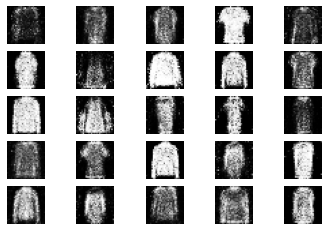

1/1 [==============================] - 0s 120ms/step
5401 [Discriminator loss: 0.413372, acc.: 78.12%] [Generator loss: 1.677459]
1/1 [==============================] - 0s 75ms/step
5402 [Discriminator loss: 0.634015, acc.: 68.75%] [Generator loss: 1.659388]
1/1 [==============================] - 0s 261ms/step
5403 [Discriminator loss: 0.486092, acc.: 75.00%] [Generator loss: 1.921953]
1/1 [==============================] - 0s 201ms/step
5404 [Discriminator loss: 0.448987, acc.: 78.12%] [Generator loss: 1.614128]
1/1 [==============================] - 0s 210ms/step
5405 [Discriminator loss: 0.439858, acc.: 79.69%] [Generator loss: 1.467565]
1/1 [==============================] - 0s 149ms/step
5406 [Discriminator loss: 0.432272, acc.: 78.12%] [Generator loss: 1.973051]
1/1 [==============================] - 0s 73ms/step
5407 [Discriminator loss: 0.385209, acc.: 84.38%] [Generator loss: 2.094282]
1/1 [==============================] - 0s 135ms/step
5408 [Discriminator loss: 0.457430, acc

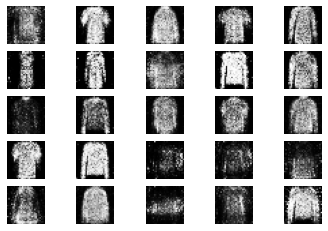

1/1 [==============================] - 0s 138ms/step
5601 [Discriminator loss: 0.430044, acc.: 81.25%] [Generator loss: 1.805820]
1/1 [==============================] - 0s 102ms/step
5602 [Discriminator loss: 0.385819, acc.: 84.38%] [Generator loss: 1.906747]
1/1 [==============================] - 0s 100ms/step
5603 [Discriminator loss: 0.447557, acc.: 79.69%] [Generator loss: 1.876060]
1/1 [==============================] - 0s 80ms/step
5604 [Discriminator loss: 0.382750, acc.: 81.25%] [Generator loss: 1.481635]
1/1 [==============================] - 0s 75ms/step
5605 [Discriminator loss: 0.417274, acc.: 79.69%] [Generator loss: 1.784218]
1/1 [==============================] - 0s 107ms/step
5606 [Discriminator loss: 0.466401, acc.: 78.12%] [Generator loss: 1.710785]
1/1 [==============================] - 0s 102ms/step
5607 [Discriminator loss: 0.326487, acc.: 90.62%] [Generator loss: 1.865514]
1/1 [==============================] - 0s 99ms/step
5608 [Discriminator loss: 0.372666, acc.

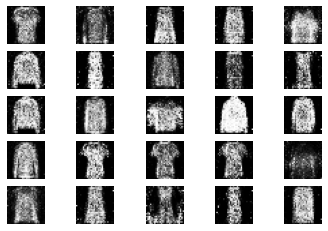

1/1 [==============================] - 0s 77ms/step
5801 [Discriminator loss: 0.312411, acc.: 84.38%] [Generator loss: 2.148921]
1/1 [==============================] - 0s 87ms/step
5802 [Discriminator loss: 0.363785, acc.: 87.50%] [Generator loss: 2.028622]
1/1 [==============================] - 0s 149ms/step
5803 [Discriminator loss: 0.355859, acc.: 85.94%] [Generator loss: 1.803573]
1/1 [==============================] - 0s 90ms/step
5804 [Discriminator loss: 0.334972, acc.: 82.81%] [Generator loss: 1.867915]
1/1 [==============================] - 0s 78ms/step
5805 [Discriminator loss: 0.412696, acc.: 75.00%] [Generator loss: 2.095990]
1/1 [==============================] - 0s 78ms/step
5806 [Discriminator loss: 0.400758, acc.: 81.25%] [Generator loss: 1.656701]
1/1 [==============================] - 0s 93ms/step
5807 [Discriminator loss: 0.457215, acc.: 71.88%] [Generator loss: 1.579917]
1/1 [==============================] - 0s 85ms/step
5808 [Discriminator loss: 0.427890, acc.: 78

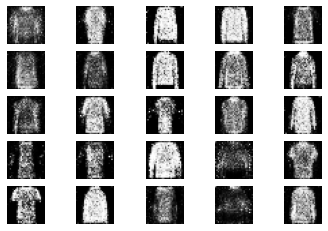

1/1 [==============================] - 0s 87ms/step
6001 [Discriminator loss: 0.273019, acc.: 92.19%] [Generator loss: 2.212940]
1/1 [==============================] - 0s 74ms/step
6002 [Discriminator loss: 0.516427, acc.: 75.00%] [Generator loss: 1.942369]
1/1 [==============================] - 0s 121ms/step
6003 [Discriminator loss: 0.413419, acc.: 81.25%] [Generator loss: 1.942922]
1/1 [==============================] - 0s 89ms/step
6004 [Discriminator loss: 0.569942, acc.: 68.75%] [Generator loss: 1.633095]
1/1 [==============================] - 0s 80ms/step
6005 [Discriminator loss: 0.305150, acc.: 85.94%] [Generator loss: 2.002257]
1/1 [==============================] - 0s 116ms/step
6006 [Discriminator loss: 0.461390, acc.: 81.25%] [Generator loss: 1.774610]
1/1 [==============================] - 0s 82ms/step
6007 [Discriminator loss: 0.391492, acc.: 82.81%] [Generator loss: 1.808382]
1/1 [==============================] - 0s 87ms/step
6008 [Discriminator loss: 0.328452, acc.: 8

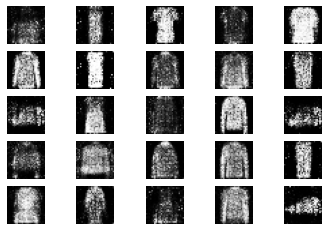

1/1 [==============================] - 0s 82ms/step
6201 [Discriminator loss: 0.345971, acc.: 84.38%] [Generator loss: 2.069600]
1/1 [==============================] - 0s 95ms/step
6202 [Discriminator loss: 0.514583, acc.: 75.00%] [Generator loss: 1.873690]
1/1 [==============================] - 0s 156ms/step
6203 [Discriminator loss: 0.373613, acc.: 84.38%] [Generator loss: 1.889775]
1/1 [==============================] - 0s 93ms/step
6204 [Discriminator loss: 0.585481, acc.: 71.88%] [Generator loss: 1.890823]
1/1 [==============================] - 0s 99ms/step
6205 [Discriminator loss: 0.304004, acc.: 92.19%] [Generator loss: 2.019485]
1/1 [==============================] - 0s 78ms/step
6206 [Discriminator loss: 0.578085, acc.: 68.75%] [Generator loss: 1.675954]
1/1 [==============================] - 0s 76ms/step
6207 [Discriminator loss: 0.442748, acc.: 79.69%] [Generator loss: 1.698958]
1/1 [==============================] - 0s 84ms/step
6208 [Discriminator loss: 0.328150, acc.: 84

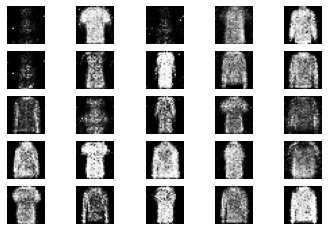

1/1 [==============================] - 0s 83ms/step
6401 [Discriminator loss: 0.313521, acc.: 87.50%] [Generator loss: 1.833311]
1/1 [==============================] - 0s 92ms/step
6402 [Discriminator loss: 0.362474, acc.: 84.38%] [Generator loss: 2.020019]
1/1 [==============================] - 0s 87ms/step
6403 [Discriminator loss: 0.377011, acc.: 82.81%] [Generator loss: 1.818941]
1/1 [==============================] - 0s 89ms/step
6404 [Discriminator loss: 0.525665, acc.: 70.31%] [Generator loss: 1.924720]
1/1 [==============================] - 0s 105ms/step
6405 [Discriminator loss: 0.333445, acc.: 90.62%] [Generator loss: 2.204396]
1/1 [==============================] - 0s 98ms/step
6406 [Discriminator loss: 0.489615, acc.: 70.31%] [Generator loss: 2.122241]
1/1 [==============================] - 0s 78ms/step
6407 [Discriminator loss: 0.406561, acc.: 81.25%] [Generator loss: 1.837886]
1/1 [==============================] - 0s 80ms/step
6408 [Discriminator loss: 0.390139, acc.: 85

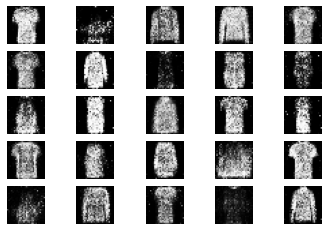

1/1 [==============================] - 0s 114ms/step
6601 [Discriminator loss: 0.406748, acc.: 76.56%] [Generator loss: 1.762389]
1/1 [==============================] - 0s 82ms/step
6602 [Discriminator loss: 0.415710, acc.: 78.12%] [Generator loss: 1.866058]
1/1 [==============================] - 0s 151ms/step
6603 [Discriminator loss: 0.464512, acc.: 81.25%] [Generator loss: 1.965164]
1/1 [==============================] - 0s 83ms/step
6604 [Discriminator loss: 0.550083, acc.: 71.88%] [Generator loss: 1.677817]
1/1 [==============================] - 0s 87ms/step
6605 [Discriminator loss: 0.511914, acc.: 71.88%] [Generator loss: 1.519603]
1/1 [==============================] - 0s 80ms/step
6606 [Discriminator loss: 0.516806, acc.: 71.88%] [Generator loss: 1.663697]
1/1 [==============================] - 0s 80ms/step
6607 [Discriminator loss: 0.366675, acc.: 84.38%] [Generator loss: 1.496697]
1/1 [==============================] - 0s 83ms/step
6608 [Discriminator loss: 0.353667, acc.: 8

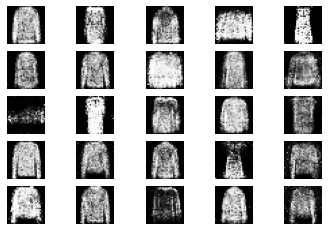

1/1 [==============================] - 0s 83ms/step
6801 [Discriminator loss: 0.330450, acc.: 85.94%] [Generator loss: 1.833542]
1/1 [==============================] - 0s 94ms/step
6802 [Discriminator loss: 0.502445, acc.: 75.00%] [Generator loss: 1.387967]
1/1 [==============================] - 0s 152ms/step
6803 [Discriminator loss: 0.595218, acc.: 68.75%] [Generator loss: 1.818248]
1/1 [==============================] - 0s 82ms/step
6804 [Discriminator loss: 0.470358, acc.: 76.56%] [Generator loss: 1.707769]
1/1 [==============================] - 0s 79ms/step
6805 [Discriminator loss: 0.608481, acc.: 71.88%] [Generator loss: 1.714838]
1/1 [==============================] - 0s 78ms/step
6806 [Discriminator loss: 0.529595, acc.: 76.56%] [Generator loss: 1.475501]
1/1 [==============================] - 0s 108ms/step
6807 [Discriminator loss: 0.418179, acc.: 82.81%] [Generator loss: 1.509300]
1/1 [==============================] - 0s 118ms/step
6808 [Discriminator loss: 0.457464, acc.: 

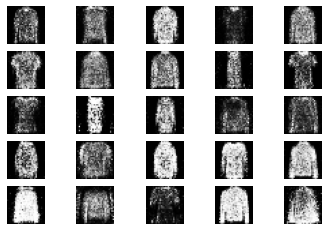

1/1 [==============================] - 0s 93ms/step
7001 [Discriminator loss: 0.421919, acc.: 76.56%] [Generator loss: 1.614403]
1/1 [==============================] - 0s 87ms/step
7002 [Discriminator loss: 0.532203, acc.: 75.00%] [Generator loss: 1.751423]
1/1 [==============================] - 0s 120ms/step
7003 [Discriminator loss: 0.409514, acc.: 78.12%] [Generator loss: 1.699038]
1/1 [==============================] - 0s 110ms/step
7004 [Discriminator loss: 0.541720, acc.: 73.44%] [Generator loss: 1.571135]
1/1 [==============================] - 0s 85ms/step
7005 [Discriminator loss: 0.631454, acc.: 65.62%] [Generator loss: 1.794166]
1/1 [==============================] - 0s 89ms/step
7006 [Discriminator loss: 0.402294, acc.: 76.56%] [Generator loss: 1.508345]
1/1 [==============================] - 0s 105ms/step
7007 [Discriminator loss: 0.545591, acc.: 75.00%] [Generator loss: 1.679094]
1/1 [==============================] - 0s 83ms/step
7008 [Discriminator loss: 0.417595, acc.: 

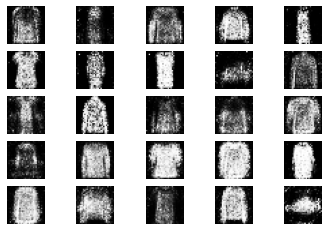

1/1 [==============================] - 0s 89ms/step
7201 [Discriminator loss: 0.454995, acc.: 78.12%] [Generator loss: 1.581324]
1/1 [==============================] - 0s 109ms/step
7202 [Discriminator loss: 0.335440, acc.: 87.50%] [Generator loss: 1.408164]
1/1 [==============================] - 0s 96ms/step
7203 [Discriminator loss: 0.387628, acc.: 82.81%] [Generator loss: 1.714809]
1/1 [==============================] - 0s 89ms/step
7204 [Discriminator loss: 0.464416, acc.: 84.38%] [Generator loss: 1.804237]
1/1 [==============================] - 0s 88ms/step
7205 [Discriminator loss: 0.520390, acc.: 76.56%] [Generator loss: 1.648729]
1/1 [==============================] - 0s 90ms/step
7206 [Discriminator loss: 0.456281, acc.: 76.56%] [Generator loss: 1.826942]
1/1 [==============================] - 0s 88ms/step
7207 [Discriminator loss: 0.385158, acc.: 87.50%] [Generator loss: 1.930754]
1/1 [==============================] - 0s 91ms/step
7208 [Discriminator loss: 0.338825, acc.: 85

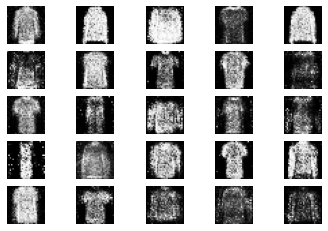

1/1 [==============================] - 0s 87ms/step
7401 [Discriminator loss: 0.517441, acc.: 81.25%] [Generator loss: 1.861813]
1/1 [==============================] - 0s 169ms/step
7402 [Discriminator loss: 0.548203, acc.: 70.31%] [Generator loss: 1.613927]
1/1 [==============================] - 0s 88ms/step
7403 [Discriminator loss: 0.572856, acc.: 71.88%] [Generator loss: 1.563177]
1/1 [==============================] - 0s 84ms/step
7404 [Discriminator loss: 0.525172, acc.: 73.44%] [Generator loss: 1.568811]
1/1 [==============================] - 0s 86ms/step
7405 [Discriminator loss: 0.454853, acc.: 82.81%] [Generator loss: 1.561724]
1/1 [==============================] - 0s 96ms/step
7406 [Discriminator loss: 0.435615, acc.: 79.69%] [Generator loss: 1.642035]
1/1 [==============================] - 0s 88ms/step
7407 [Discriminator loss: 0.636674, acc.: 68.75%] [Generator loss: 1.597065]
1/1 [==============================] - 0s 89ms/step
7408 [Discriminator loss: 0.447867, acc.: 71

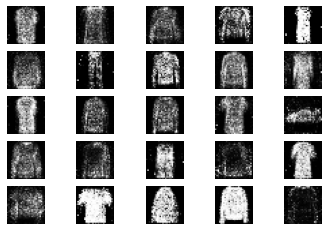

1/1 [==============================] - 0s 106ms/step
7601 [Discriminator loss: 0.505775, acc.: 73.44%] [Generator loss: 1.523759]
1/1 [==============================] - 0s 293ms/step
7602 [Discriminator loss: 0.675499, acc.: 59.38%] [Generator loss: 1.360505]
1/1 [==============================] - 0s 93ms/step
7603 [Discriminator loss: 0.617474, acc.: 70.31%] [Generator loss: 1.582435]
1/1 [==============================] - 0s 203ms/step
7604 [Discriminator loss: 0.413241, acc.: 76.56%] [Generator loss: 1.889415]
1/1 [==============================] - 0s 113ms/step
7605 [Discriminator loss: 0.447500, acc.: 82.81%] [Generator loss: 1.611829]
1/1 [==============================] - 0s 94ms/step
7606 [Discriminator loss: 0.540180, acc.: 70.31%] [Generator loss: 1.806377]
1/1 [==============================] - 0s 140ms/step
7607 [Discriminator loss: 0.399344, acc.: 82.81%] [Generator loss: 1.651522]
1/1 [==============================] - 0s 99ms/step
7608 [Discriminator loss: 0.456813, acc.

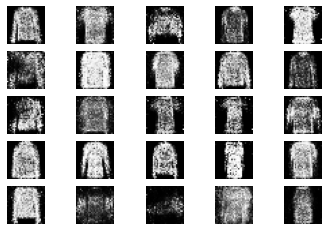

1/1 [==============================] - 0s 78ms/step
7801 [Discriminator loss: 0.474206, acc.: 75.00%] [Generator loss: 1.900896]
1/1 [==============================] - 0s 63ms/step
7802 [Discriminator loss: 0.451456, acc.: 78.12%] [Generator loss: 1.954077]
1/1 [==============================] - 0s 78ms/step
7803 [Discriminator loss: 0.551285, acc.: 75.00%] [Generator loss: 1.775987]
1/1 [==============================] - 0s 109ms/step
7804 [Discriminator loss: 0.372106, acc.: 79.69%] [Generator loss: 1.691798]
1/1 [==============================] - 0s 78ms/step
7805 [Discriminator loss: 0.519797, acc.: 73.44%] [Generator loss: 1.750016]
1/1 [==============================] - 0s 94ms/step
7806 [Discriminator loss: 0.401124, acc.: 84.38%] [Generator loss: 1.744792]
1/1 [==============================] - 0s 94ms/step
7807 [Discriminator loss: 0.486825, acc.: 75.00%] [Generator loss: 1.679711]
1/1 [==============================] - 0s 110ms/step
7808 [Discriminator loss: 0.388802, acc.: 8

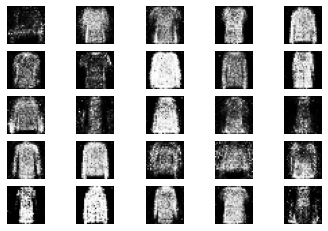

1/1 [==============================] - 0s 94ms/step
8001 [Discriminator loss: 0.613667, acc.: 70.31%] [Generator loss: 1.566937]
1/1 [==============================] - 0s 78ms/step
8002 [Discriminator loss: 0.382960, acc.: 84.38%] [Generator loss: 1.466635]
1/1 [==============================] - 0s 63ms/step
8003 [Discriminator loss: 0.533348, acc.: 70.31%] [Generator loss: 1.556565]
1/1 [==============================] - 0s 78ms/step
8004 [Discriminator loss: 0.451488, acc.: 76.56%] [Generator loss: 1.945602]
1/1 [==============================] - 0s 78ms/step
8005 [Discriminator loss: 0.529629, acc.: 75.00%] [Generator loss: 1.944408]
1/1 [==============================] - 0s 79ms/step
8006 [Discriminator loss: 0.345373, acc.: 82.81%] [Generator loss: 2.107164]
1/1 [==============================] - 0s 78ms/step
8007 [Discriminator loss: 0.445700, acc.: 78.12%] [Generator loss: 1.800936]
1/1 [==============================] - 0s 78ms/step
8008 [Discriminator loss: 0.446009, acc.: 79.

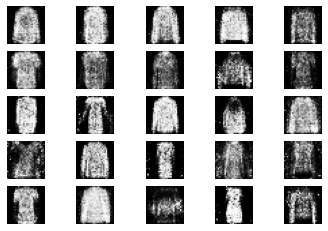

1/1 [==============================] - 0s 112ms/step
8201 [Discriminator loss: 0.519234, acc.: 65.62%] [Generator loss: 1.922156]
1/1 [==============================] - 0s 84ms/step
8202 [Discriminator loss: 0.438074, acc.: 82.81%] [Generator loss: 1.640485]
1/1 [==============================] - 0s 112ms/step
8203 [Discriminator loss: 0.442940, acc.: 78.12%] [Generator loss: 1.839744]
1/1 [==============================] - 0s 93ms/step
8204 [Discriminator loss: 0.312515, acc.: 90.62%] [Generator loss: 1.566867]
1/1 [==============================] - 0s 96ms/step
8205 [Discriminator loss: 0.410049, acc.: 84.38%] [Generator loss: 1.907737]
1/1 [==============================] - 0s 82ms/step
8206 [Discriminator loss: 0.509200, acc.: 79.69%] [Generator loss: 1.779515]
1/1 [==============================] - 0s 87ms/step
8207 [Discriminator loss: 0.366907, acc.: 87.50%] [Generator loss: 1.759669]
1/1 [==============================] - 0s 107ms/step
8208 [Discriminator loss: 0.380309, acc.: 

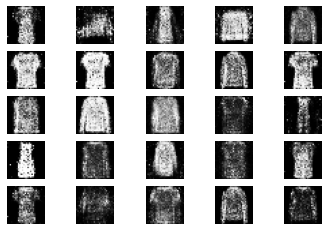

1/1 [==============================] - 0s 127ms/step
8401 [Discriminator loss: 0.444558, acc.: 78.12%] [Generator loss: 1.757508]
1/1 [==============================] - 0s 110ms/step
8402 [Discriminator loss: 0.358234, acc.: 81.25%] [Generator loss: 1.677706]
1/1 [==============================] - 0s 98ms/step
8403 [Discriminator loss: 0.328103, acc.: 87.50%] [Generator loss: 1.740355]
1/1 [==============================] - 0s 88ms/step
8404 [Discriminator loss: 0.396020, acc.: 85.94%] [Generator loss: 1.850640]
1/1 [==============================] - 0s 89ms/step
8405 [Discriminator loss: 0.658670, acc.: 67.19%] [Generator loss: 1.600617]
1/1 [==============================] - 0s 88ms/step
8406 [Discriminator loss: 0.453567, acc.: 76.56%] [Generator loss: 1.485534]
1/1 [==============================] - 0s 89ms/step
8407 [Discriminator loss: 0.412010, acc.: 82.81%] [Generator loss: 1.746799]
1/1 [==============================] - 0s 86ms/step
8408 [Discriminator loss: 0.453486, acc.: 7

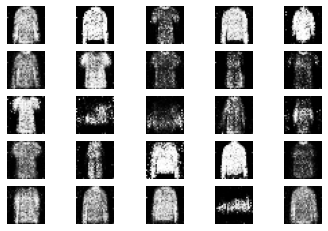

1/1 [==============================] - 0s 96ms/step
8601 [Discriminator loss: 0.571158, acc.: 68.75%] [Generator loss: 1.829856]
1/1 [==============================] - 0s 98ms/step
8602 [Discriminator loss: 0.513664, acc.: 73.44%] [Generator loss: 1.918478]
1/1 [==============================] - 0s 98ms/step
8603 [Discriminator loss: 0.353729, acc.: 81.25%] [Generator loss: 1.979457]
1/1 [==============================] - 0s 100ms/step
8604 [Discriminator loss: 0.471930, acc.: 75.00%] [Generator loss: 1.498355]
1/1 [==============================] - 0s 104ms/step
8605 [Discriminator loss: 0.361617, acc.: 84.38%] [Generator loss: 1.629138]
1/1 [==============================] - 0s 88ms/step
8606 [Discriminator loss: 0.314834, acc.: 89.06%] [Generator loss: 1.614488]
1/1 [==============================] - 0s 89ms/step
8607 [Discriminator loss: 0.262521, acc.: 90.62%] [Generator loss: 1.674247]
1/1 [==============================] - 0s 226ms/step
8608 [Discriminator loss: 0.461111, acc.: 

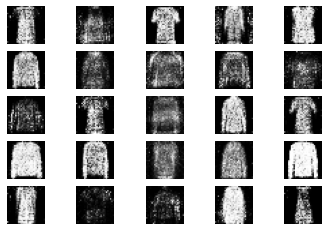

1/1 [==============================] - 0s 88ms/step
8801 [Discriminator loss: 0.554329, acc.: 67.19%] [Generator loss: 1.647809]
1/1 [==============================] - 0s 88ms/step
8802 [Discriminator loss: 0.480113, acc.: 75.00%] [Generator loss: 1.924705]
1/1 [==============================] - 0s 105ms/step
8803 [Discriminator loss: 0.468969, acc.: 75.00%] [Generator loss: 1.318144]
1/1 [==============================] - 0s 89ms/step
8804 [Discriminator loss: 0.436950, acc.: 75.00%] [Generator loss: 1.482946]
1/1 [==============================] - 0s 88ms/step
8805 [Discriminator loss: 0.399504, acc.: 81.25%] [Generator loss: 1.501112]
1/1 [==============================] - 0s 89ms/step
8806 [Discriminator loss: 0.360535, acc.: 85.94%] [Generator loss: 1.779610]
1/1 [==============================] - 0s 97ms/step
8807 [Discriminator loss: 0.380459, acc.: 85.94%] [Generator loss: 1.795485]
1/1 [==============================] - 0s 88ms/step
8808 [Discriminator loss: 0.508014, acc.: 76

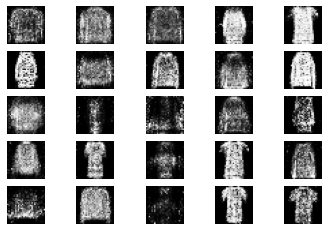

1/1 [==============================] - 0s 105ms/step
9001 [Discriminator loss: 0.368939, acc.: 87.50%] [Generator loss: 1.849547]
1/1 [==============================] - 0s 89ms/step
9002 [Discriminator loss: 0.414701, acc.: 84.38%] [Generator loss: 1.883494]
1/1 [==============================] - 0s 112ms/step
9003 [Discriminator loss: 0.459299, acc.: 75.00%] [Generator loss: 1.576131]
1/1 [==============================] - 0s 81ms/step
9004 [Discriminator loss: 0.332757, acc.: 85.94%] [Generator loss: 1.822951]
1/1 [==============================] - 0s 89ms/step
9005 [Discriminator loss: 0.432082, acc.: 75.00%] [Generator loss: 1.669783]
1/1 [==============================] - 0s 97ms/step
9006 [Discriminator loss: 0.544314, acc.: 76.56%] [Generator loss: 1.599266]
1/1 [==============================] - 0s 87ms/step
9007 [Discriminator loss: 0.462705, acc.: 76.56%] [Generator loss: 1.826287]
1/1 [==============================] - 0s 96ms/step
9008 [Discriminator loss: 0.407040, acc.: 8

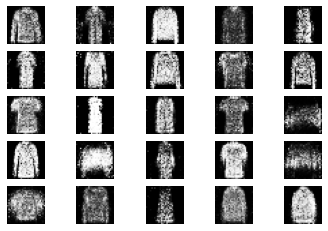

1/1 [==============================] - 0s 88ms/step
9201 [Discriminator loss: 0.403113, acc.: 82.81%] [Generator loss: 1.641517]
1/1 [==============================] - 0s 122ms/step
9202 [Discriminator loss: 0.505104, acc.: 73.44%] [Generator loss: 1.729201]
1/1 [==============================] - 0s 93ms/step
9203 [Discriminator loss: 0.369265, acc.: 81.25%] [Generator loss: 1.914441]
1/1 [==============================] - 0s 97ms/step
9204 [Discriminator loss: 0.407837, acc.: 81.25%] [Generator loss: 1.675412]
1/1 [==============================] - 0s 88ms/step
9205 [Discriminator loss: 0.371979, acc.: 85.94%] [Generator loss: 1.863803]
1/1 [==============================] - 0s 88ms/step
9206 [Discriminator loss: 0.548194, acc.: 71.88%] [Generator loss: 1.567272]
1/1 [==============================] - 0s 105ms/step
9207 [Discriminator loss: 0.331817, acc.: 89.06%] [Generator loss: 1.715049]
1/1 [==============================] - 0s 88ms/step
9208 [Discriminator loss: 0.443175, acc.: 7

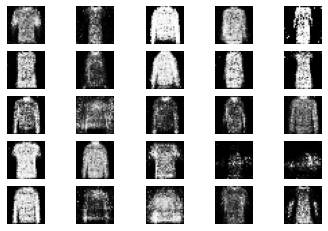

1/1 [==============================] - 0s 88ms/step
9401 [Discriminator loss: 0.458170, acc.: 78.12%] [Generator loss: 1.643180]
1/1 [==============================] - 0s 88ms/step
9402 [Discriminator loss: 0.468795, acc.: 75.00%] [Generator loss: 1.630973]
1/1 [==============================] - 0s 97ms/step
9403 [Discriminator loss: 0.477597, acc.: 79.69%] [Generator loss: 1.782695]
1/1 [==============================] - 0s 96ms/step
9404 [Discriminator loss: 0.526958, acc.: 68.75%] [Generator loss: 1.719786]
1/1 [==============================] - 0s 113ms/step
9405 [Discriminator loss: 0.267342, acc.: 89.06%] [Generator loss: 1.892091]
1/1 [==============================] - 0s 95ms/step
9406 [Discriminator loss: 0.442434, acc.: 75.00%] [Generator loss: 1.572524]
1/1 [==============================] - 0s 100ms/step
9407 [Discriminator loss: 0.473426, acc.: 81.25%] [Generator loss: 1.491154]
1/1 [==============================] - 0s 121ms/step
9408 [Discriminator loss: 0.355834, acc.: 

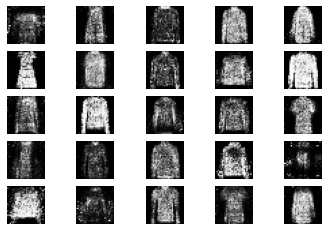

1/1 [==============================] - 0s 104ms/step
9601 [Discriminator loss: 0.385499, acc.: 87.50%] [Generator loss: 1.906897]
1/1 [==============================] - 0s 90ms/step
9602 [Discriminator loss: 0.403322, acc.: 79.69%] [Generator loss: 2.068769]
1/1 [==============================] - 0s 140ms/step
9603 [Discriminator loss: 0.316685, acc.: 81.25%] [Generator loss: 1.896059]
1/1 [==============================] - 0s 95ms/step
9604 [Discriminator loss: 0.392040, acc.: 79.69%] [Generator loss: 1.663139]
1/1 [==============================] - 0s 89ms/step
9605 [Discriminator loss: 0.454070, acc.: 73.44%] [Generator loss: 1.819140]
1/1 [==============================] - 0s 103ms/step
9606 [Discriminator loss: 0.413167, acc.: 81.25%] [Generator loss: 1.739984]
1/1 [==============================] - 0s 97ms/step
9607 [Discriminator loss: 0.477427, acc.: 71.88%] [Generator loss: 1.556384]
1/1 [==============================] - 0s 98ms/step
9608 [Discriminator loss: 0.425493, acc.: 

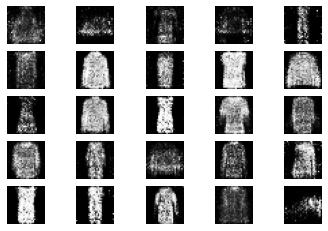

1/1 [==============================] - 0s 103ms/step
9801 [Discriminator loss: 0.478375, acc.: 78.12%] [Generator loss: 1.887256]
1/1 [==============================] - 0s 132ms/step
9802 [Discriminator loss: 0.494892, acc.: 81.25%] [Generator loss: 1.613033]
1/1 [==============================] - 0s 110ms/step
9803 [Discriminator loss: 0.400290, acc.: 81.25%] [Generator loss: 1.624861]
1/1 [==============================] - 0s 98ms/step
9804 [Discriminator loss: 0.444046, acc.: 78.12%] [Generator loss: 1.872862]
1/1 [==============================] - 0s 96ms/step
9805 [Discriminator loss: 0.379330, acc.: 81.25%] [Generator loss: 1.903280]
1/1 [==============================] - 0s 96ms/step
9806 [Discriminator loss: 0.294330, acc.: 90.62%] [Generator loss: 1.801856]
1/1 [==============================] - 0s 88ms/step
9807 [Discriminator loss: 0.340426, acc.: 84.38%] [Generator loss: 1.915800]
1/1 [==============================] - 0s 96ms/step
9808 [Discriminator loss: 0.596041, acc.: 

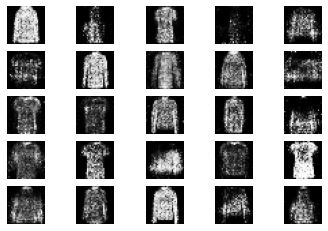

1/1 [==============================] - 0s 97ms/step
10001 [Discriminator loss: 0.519141, acc.: 76.56%] [Generator loss: 1.645359]
1/1 [==============================] - 0s 113ms/step
10002 [Discriminator loss: 0.443948, acc.: 75.00%] [Generator loss: 1.542498]
1/1 [==============================] - 0s 104ms/step
10003 [Discriminator loss: 0.402116, acc.: 85.94%] [Generator loss: 1.730564]
1/1 [==============================] - 0s 96ms/step
10004 [Discriminator loss: 0.449732, acc.: 76.56%] [Generator loss: 1.594353]
1/1 [==============================] - 0s 88ms/step
10005 [Discriminator loss: 0.409419, acc.: 81.25%] [Generator loss: 1.807612]
1/1 [==============================] - 0s 125ms/step
10006 [Discriminator loss: 0.381216, acc.: 85.94%] [Generator loss: 1.789343]
1/1 [==============================] - 0s 112ms/step
10007 [Discriminator loss: 0.500155, acc.: 81.25%] [Generator loss: 1.541065]
1/1 [==============================] - 0s 96ms/step
10008 [Discriminator loss: 0.43588

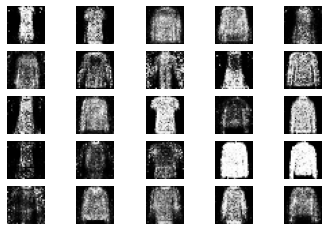

1/1 [==============================] - 0s 87ms/step
10201 [Discriminator loss: 0.385388, acc.: 89.06%] [Generator loss: 1.411431]
1/1 [==============================] - 0s 105ms/step
10202 [Discriminator loss: 0.391118, acc.: 85.94%] [Generator loss: 1.654039]
1/1 [==============================] - 0s 112ms/step
10203 [Discriminator loss: 0.478140, acc.: 76.56%] [Generator loss: 1.680139]
1/1 [==============================] - 0s 106ms/step
10204 [Discriminator loss: 0.509330, acc.: 75.00%] [Generator loss: 1.488920]
1/1 [==============================] - 0s 98ms/step
10205 [Discriminator loss: 0.429146, acc.: 79.69%] [Generator loss: 1.516717]
1/1 [==============================] - 0s 95ms/step
10206 [Discriminator loss: 0.454354, acc.: 79.69%] [Generator loss: 1.619197]
1/1 [==============================] - 0s 99ms/step
10207 [Discriminator loss: 0.441105, acc.: 78.12%] [Generator loss: 1.639651]
1/1 [==============================] - 0s 97ms/step
10208 [Discriminator loss: 0.392311

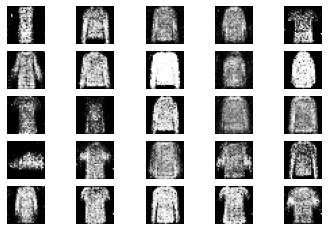

1/1 [==============================] - 0s 113ms/step
10401 [Discriminator loss: 0.413936, acc.: 84.38%] [Generator loss: 1.773105]
1/1 [==============================] - 0s 114ms/step
10402 [Discriminator loss: 0.368916, acc.: 82.81%] [Generator loss: 1.739757]
1/1 [==============================] - 0s 109ms/step
10403 [Discriminator loss: 0.518851, acc.: 71.88%] [Generator loss: 1.612274]
1/1 [==============================] - 0s 116ms/step
10404 [Discriminator loss: 0.503371, acc.: 71.88%] [Generator loss: 1.695591]
1/1 [==============================] - 0s 93ms/step
10405 [Discriminator loss: 0.427015, acc.: 76.56%] [Generator loss: 1.709159]
1/1 [==============================] - 0s 98ms/step
10406 [Discriminator loss: 0.470265, acc.: 75.00%] [Generator loss: 1.656594]
1/1 [==============================] - 0s 106ms/step
10407 [Discriminator loss: 0.430320, acc.: 78.12%] [Generator loss: 1.735534]
1/1 [==============================] - 0s 104ms/step
10408 [Discriminator loss: 0.381

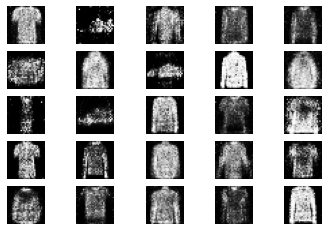

1/1 [==============================] - 0s 105ms/step
10601 [Discriminator loss: 0.418312, acc.: 76.56%] [Generator loss: 1.979675]
1/1 [==============================] - 0s 137ms/step
10602 [Discriminator loss: 0.456297, acc.: 78.12%] [Generator loss: 1.826910]
1/1 [==============================] - 0s 105ms/step
10603 [Discriminator loss: 0.375390, acc.: 82.81%] [Generator loss: 1.611812]
1/1 [==============================] - 0s 98ms/step
10604 [Discriminator loss: 0.382040, acc.: 89.06%] [Generator loss: 1.596692]
1/1 [==============================] - 0s 97ms/step
10605 [Discriminator loss: 0.519081, acc.: 76.56%] [Generator loss: 1.203369]
1/1 [==============================] - 0s 128ms/step
10606 [Discriminator loss: 0.415613, acc.: 79.69%] [Generator loss: 1.451642]
1/1 [==============================] - 0s 100ms/step
10607 [Discriminator loss: 0.327247, acc.: 84.38%] [Generator loss: 1.591884]
1/1 [==============================] - 0s 104ms/step
10608 [Discriminator loss: 0.488

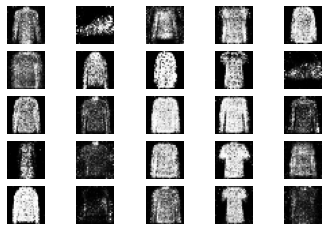

1/1 [==============================] - 0s 83ms/step
10801 [Discriminator loss: 0.384010, acc.: 82.81%] [Generator loss: 1.493719]
1/1 [==============================] - 0s 70ms/step
10802 [Discriminator loss: 0.484227, acc.: 76.56%] [Generator loss: 1.415431]
1/1 [==============================] - 0s 76ms/step
10803 [Discriminator loss: 0.454435, acc.: 76.56%] [Generator loss: 1.405252]
1/1 [==============================] - 0s 74ms/step
10804 [Discriminator loss: 0.389733, acc.: 81.25%] [Generator loss: 1.434924]
1/1 [==============================] - 0s 68ms/step
10805 [Discriminator loss: 0.472666, acc.: 78.12%] [Generator loss: 1.699509]
1/1 [==============================] - 0s 85ms/step
10806 [Discriminator loss: 0.458445, acc.: 78.12%] [Generator loss: 1.751190]
1/1 [==============================] - 0s 68ms/step
10807 [Discriminator loss: 0.536149, acc.: 71.88%] [Generator loss: 1.655504]
1/1 [==============================] - 0s 74ms/step
10808 [Discriminator loss: 0.520211, a

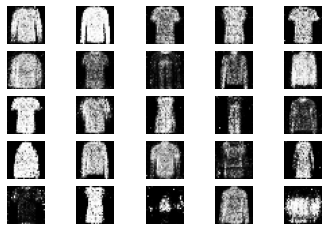

1/1 [==============================] - 0s 115ms/step
11001 [Discriminator loss: 0.367647, acc.: 84.38%] [Generator loss: 1.755742]
1/1 [==============================] - 0s 69ms/step
11002 [Discriminator loss: 0.531909, acc.: 67.19%] [Generator loss: 1.718534]
1/1 [==============================] - 0s 77ms/step
11003 [Discriminator loss: 0.491197, acc.: 73.44%] [Generator loss: 1.869081]
1/1 [==============================] - 0s 72ms/step
11004 [Discriminator loss: 0.554598, acc.: 65.62%] [Generator loss: 1.695109]
1/1 [==============================] - 0s 66ms/step
11005 [Discriminator loss: 0.471606, acc.: 79.69%] [Generator loss: 1.681272]
1/1 [==============================] - 0s 70ms/step
11006 [Discriminator loss: 0.494718, acc.: 76.56%] [Generator loss: 1.680555]
1/1 [==============================] - 0s 72ms/step
11007 [Discriminator loss: 0.422880, acc.: 82.81%] [Generator loss: 1.662355]
1/1 [==============================] - 0s 84ms/step
11008 [Discriminator loss: 0.375238, 

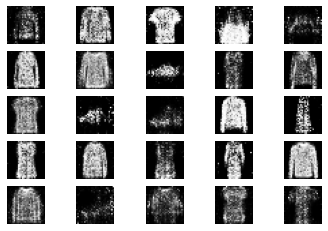

1/1 [==============================] - 0s 77ms/step
11201 [Discriminator loss: 0.487031, acc.: 79.69%] [Generator loss: 1.678764]
1/1 [==============================] - 0s 82ms/step
11202 [Discriminator loss: 0.386066, acc.: 81.25%] [Generator loss: 1.794247]
1/1 [==============================] - 0s 84ms/step
11203 [Discriminator loss: 0.456577, acc.: 73.44%] [Generator loss: 1.721207]
1/1 [==============================] - 0s 68ms/step
11204 [Discriminator loss: 0.359912, acc.: 85.94%] [Generator loss: 1.752599]
1/1 [==============================] - 0s 72ms/step
11205 [Discriminator loss: 0.408241, acc.: 82.81%] [Generator loss: 1.728070]
1/1 [==============================] - 0s 71ms/step
11206 [Discriminator loss: 0.573469, acc.: 68.75%] [Generator loss: 1.782719]
1/1 [==============================] - 0s 94ms/step
11207 [Discriminator loss: 0.465325, acc.: 76.56%] [Generator loss: 1.913820]
1/1 [==============================] - 0s 70ms/step
11208 [Discriminator loss: 0.533606, a

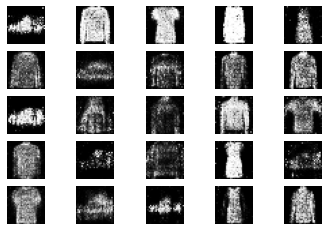

1/1 [==============================] - 0s 109ms/step
11401 [Discriminator loss: 0.497599, acc.: 71.88%] [Generator loss: 1.381860]
1/1 [==============================] - 0s 72ms/step
11402 [Discriminator loss: 0.542830, acc.: 65.62%] [Generator loss: 1.654079]
1/1 [==============================] - 0s 79ms/step
11403 [Discriminator loss: 0.441249, acc.: 81.25%] [Generator loss: 1.777431]
1/1 [==============================] - 0s 68ms/step
11404 [Discriminator loss: 0.427966, acc.: 78.12%] [Generator loss: 1.818180]
1/1 [==============================] - 0s 70ms/step
11405 [Discriminator loss: 0.444313, acc.: 81.25%] [Generator loss: 1.490483]
1/1 [==============================] - 0s 71ms/step
11406 [Discriminator loss: 0.367540, acc.: 87.50%] [Generator loss: 1.507018]
1/1 [==============================] - 0s 79ms/step
11407 [Discriminator loss: 0.597620, acc.: 68.75%] [Generator loss: 1.652892]
1/1 [==============================] - 0s 75ms/step
11408 [Discriminator loss: 0.541665, 

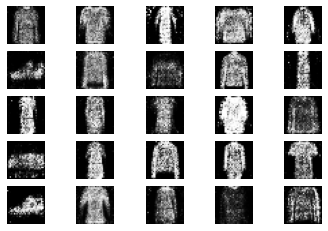

1/1 [==============================] - 0s 77ms/step
11601 [Discriminator loss: 0.483680, acc.: 70.31%] [Generator loss: 1.824011]
1/1 [==============================] - 0s 76ms/step
11602 [Discriminator loss: 0.499187, acc.: 76.56%] [Generator loss: 1.913081]
1/1 [==============================] - 0s 81ms/step
11603 [Discriminator loss: 0.574700, acc.: 75.00%] [Generator loss: 1.777689]
1/1 [==============================] - 0s 74ms/step
11604 [Discriminator loss: 0.478339, acc.: 78.12%] [Generator loss: 1.558543]
1/1 [==============================] - 0s 71ms/step
11605 [Discriminator loss: 0.384325, acc.: 87.50%] [Generator loss: 1.483356]
1/1 [==============================] - 0s 77ms/step
11606 [Discriminator loss: 0.470990, acc.: 81.25%] [Generator loss: 1.499248]
1/1 [==============================] - 0s 72ms/step
11607 [Discriminator loss: 0.510770, acc.: 68.75%] [Generator loss: 1.591686]
1/1 [==============================] - 0s 72ms/step
11608 [Discriminator loss: 0.451873, a

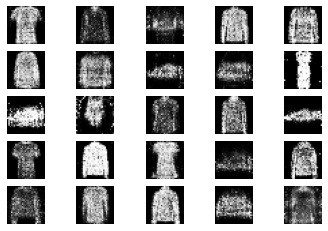

1/1 [==============================] - 0s 76ms/step
11801 [Discriminator loss: 0.492351, acc.: 75.00%] [Generator loss: 1.620283]
1/1 [==============================] - 0s 78ms/step
11802 [Discriminator loss: 0.525833, acc.: 71.88%] [Generator loss: 1.318754]
1/1 [==============================] - 0s 79ms/step
11803 [Discriminator loss: 0.436404, acc.: 81.25%] [Generator loss: 1.754605]
1/1 [==============================] - 0s 77ms/step
11804 [Discriminator loss: 0.402559, acc.: 81.25%] [Generator loss: 2.007501]
1/1 [==============================] - 0s 75ms/step
11805 [Discriminator loss: 0.366820, acc.: 84.38%] [Generator loss: 1.850829]
1/1 [==============================] - 0s 74ms/step
11806 [Discriminator loss: 0.454044, acc.: 79.69%] [Generator loss: 1.881138]
1/1 [==============================] - 0s 74ms/step
11807 [Discriminator loss: 0.399257, acc.: 79.69%] [Generator loss: 1.863757]
1/1 [==============================] - 0s 73ms/step
11808 [Discriminator loss: 0.432960, a

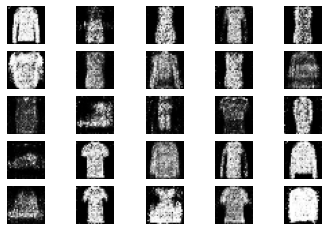

1/1 [==============================] - 0s 97ms/step
12001 [Discriminator loss: 0.442230, acc.: 84.38%] [Generator loss: 1.649373]
1/1 [==============================] - 0s 76ms/step
12002 [Discriminator loss: 0.416285, acc.: 84.38%] [Generator loss: 1.789689]
1/1 [==============================] - 0s 78ms/step
12003 [Discriminator loss: 0.468382, acc.: 81.25%] [Generator loss: 1.607627]
1/1 [==============================] - 0s 75ms/step
12004 [Discriminator loss: 0.620031, acc.: 65.62%] [Generator loss: 1.550182]
1/1 [==============================] - 0s 75ms/step
12005 [Discriminator loss: 0.441256, acc.: 82.81%] [Generator loss: 1.848827]
1/1 [==============================] - 0s 75ms/step
12006 [Discriminator loss: 0.505409, acc.: 73.44%] [Generator loss: 1.543952]
1/1 [==============================] - 0s 75ms/step
12007 [Discriminator loss: 0.550792, acc.: 73.44%] [Generator loss: 1.668037]
1/1 [==============================] - 0s 77ms/step
12008 [Discriminator loss: 0.554373, a

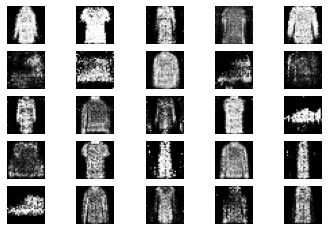

1/1 [==============================] - 0s 126ms/step
12201 [Discriminator loss: 0.426097, acc.: 79.69%] [Generator loss: 1.589390]
1/1 [==============================] - 0s 82ms/step
12202 [Discriminator loss: 0.468870, acc.: 82.81%] [Generator loss: 1.653240]
1/1 [==============================] - 0s 74ms/step
12203 [Discriminator loss: 0.473709, acc.: 79.69%] [Generator loss: 1.629824]
1/1 [==============================] - 0s 79ms/step
12204 [Discriminator loss: 0.342810, acc.: 84.38%] [Generator loss: 1.999502]
1/1 [==============================] - 0s 78ms/step
12205 [Discriminator loss: 0.527618, acc.: 73.44%] [Generator loss: 1.818076]
1/1 [==============================] - 0s 76ms/step
12206 [Discriminator loss: 0.589973, acc.: 73.44%] [Generator loss: 1.451247]
1/1 [==============================] - 0s 75ms/step
12207 [Discriminator loss: 0.541408, acc.: 75.00%] [Generator loss: 1.649964]
1/1 [==============================] - 0s 75ms/step
12208 [Discriminator loss: 0.485437, 

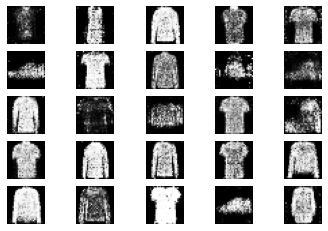

1/1 [==============================] - 0s 111ms/step
12401 [Discriminator loss: 0.432337, acc.: 81.25%] [Generator loss: 1.702557]
1/1 [==============================] - 0s 103ms/step
12402 [Discriminator loss: 0.401750, acc.: 81.25%] [Generator loss: 1.582622]
1/1 [==============================] - 0s 78ms/step
12403 [Discriminator loss: 0.333315, acc.: 87.50%] [Generator loss: 1.420180]
1/1 [==============================] - 0s 76ms/step
12404 [Discriminator loss: 0.451856, acc.: 76.56%] [Generator loss: 1.556961]
1/1 [==============================] - 0s 104ms/step
12405 [Discriminator loss: 0.383804, acc.: 79.69%] [Generator loss: 1.751093]
1/1 [==============================] - 0s 75ms/step
12406 [Discriminator loss: 0.401677, acc.: 82.81%] [Generator loss: 1.808995]
1/1 [==============================] - 0s 77ms/step
12407 [Discriminator loss: 0.434618, acc.: 85.94%] [Generator loss: 1.861313]
1/1 [==============================] - 0s 73ms/step
12408 [Discriminator loss: 0.492651

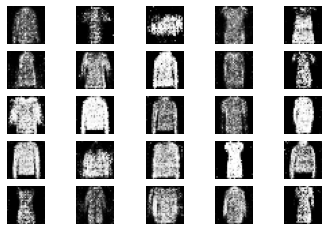

1/1 [==============================] - 0s 75ms/step
12601 [Discriminator loss: 0.513314, acc.: 75.00%] [Generator loss: 1.938987]
1/1 [==============================] - 0s 83ms/step
12602 [Discriminator loss: 0.428955, acc.: 76.56%] [Generator loss: 1.814930]
1/1 [==============================] - 0s 82ms/step
12603 [Discriminator loss: 0.475446, acc.: 75.00%] [Generator loss: 1.838984]
1/1 [==============================] - 0s 98ms/step
12604 [Discriminator loss: 0.412316, acc.: 84.38%] [Generator loss: 1.910919]
1/1 [==============================] - 0s 86ms/step
12605 [Discriminator loss: 0.507688, acc.: 73.44%] [Generator loss: 1.824775]
1/1 [==============================] - 0s 85ms/step
12606 [Discriminator loss: 0.391130, acc.: 79.69%] [Generator loss: 1.712230]
1/1 [==============================] - 0s 78ms/step
12607 [Discriminator loss: 0.414000, acc.: 82.81%] [Generator loss: 1.459597]
1/1 [==============================] - 0s 81ms/step
12608 [Discriminator loss: 0.383945, a

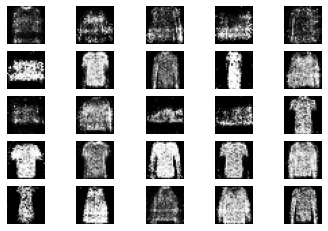

1/1 [==============================] - 0s 95ms/step
12801 [Discriminator loss: 0.464393, acc.: 76.56%] [Generator loss: 1.528215]
1/1 [==============================] - 0s 80ms/step
12802 [Discriminator loss: 0.430971, acc.: 85.94%] [Generator loss: 1.432352]
1/1 [==============================] - 0s 100ms/step
12803 [Discriminator loss: 0.474724, acc.: 75.00%] [Generator loss: 1.620224]
1/1 [==============================] - 0s 85ms/step
12804 [Discriminator loss: 0.426804, acc.: 79.69%] [Generator loss: 1.617187]
1/1 [==============================] - 0s 89ms/step
12805 [Discriminator loss: 0.487449, acc.: 71.88%] [Generator loss: 1.695073]
1/1 [==============================] - 0s 78ms/step
12806 [Discriminator loss: 0.449866, acc.: 76.56%] [Generator loss: 1.731843]
1/1 [==============================] - 0s 80ms/step
12807 [Discriminator loss: 0.489032, acc.: 75.00%] [Generator loss: 1.688503]
1/1 [==============================] - 0s 77ms/step
12808 [Discriminator loss: 0.514655, 

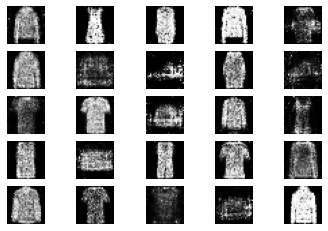

1/1 [==============================] - 0s 80ms/step
13001 [Discriminator loss: 0.490682, acc.: 73.44%] [Generator loss: 1.919020]
1/1 [==============================] - 0s 79ms/step
13002 [Discriminator loss: 0.414322, acc.: 78.12%] [Generator loss: 1.835362]
1/1 [==============================] - 0s 79ms/step
13003 [Discriminator loss: 0.408990, acc.: 79.69%] [Generator loss: 1.853427]
1/1 [==============================] - 0s 75ms/step
13004 [Discriminator loss: 0.355160, acc.: 84.38%] [Generator loss: 1.855716]
1/1 [==============================] - 0s 80ms/step
13005 [Discriminator loss: 0.485396, acc.: 84.38%] [Generator loss: 1.521610]
1/1 [==============================] - 0s 77ms/step
13006 [Discriminator loss: 0.537497, acc.: 73.44%] [Generator loss: 1.583285]
1/1 [==============================] - 0s 77ms/step
13007 [Discriminator loss: 0.431024, acc.: 82.81%] [Generator loss: 1.690419]
1/1 [==============================] - 0s 77ms/step
13008 [Discriminator loss: 0.430667, a

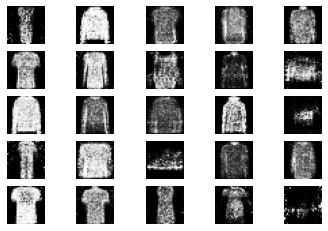

1/1 [==============================] - 0s 135ms/step
13201 [Discriminator loss: 0.430496, acc.: 81.25%] [Generator loss: 1.721680]
1/1 [==============================] - 0s 85ms/step
13202 [Discriminator loss: 0.485907, acc.: 76.56%] [Generator loss: 1.786347]
1/1 [==============================] - 0s 97ms/step
13203 [Discriminator loss: 0.441998, acc.: 76.56%] [Generator loss: 1.489065]
1/1 [==============================] - 0s 76ms/step
13204 [Discriminator loss: 0.450000, acc.: 76.56%] [Generator loss: 1.553322]
1/1 [==============================] - 0s 78ms/step
13205 [Discriminator loss: 0.449740, acc.: 76.56%] [Generator loss: 1.887055]
1/1 [==============================] - 0s 80ms/step
13206 [Discriminator loss: 0.516263, acc.: 70.31%] [Generator loss: 1.779738]
1/1 [==============================] - 0s 82ms/step
13207 [Discriminator loss: 0.398893, acc.: 82.81%] [Generator loss: 1.960842]
1/1 [==============================] - 0s 82ms/step
13208 [Discriminator loss: 0.596821, 

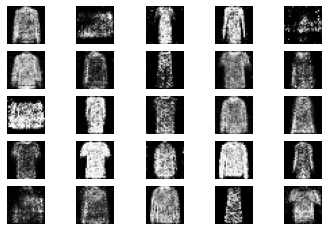

1/1 [==============================] - 0s 104ms/step
13401 [Discriminator loss: 0.393348, acc.: 82.81%] [Generator loss: 1.704633]
1/1 [==============================] - 0s 105ms/step
13402 [Discriminator loss: 0.515548, acc.: 78.12%] [Generator loss: 1.486424]
1/1 [==============================] - 0s 83ms/step
13403 [Discriminator loss: 0.416115, acc.: 84.38%] [Generator loss: 1.499701]
1/1 [==============================] - 0s 78ms/step
13404 [Discriminator loss: 0.463582, acc.: 75.00%] [Generator loss: 1.488133]
1/1 [==============================] - 0s 79ms/step
13405 [Discriminator loss: 0.432188, acc.: 79.69%] [Generator loss: 1.812861]
1/1 [==============================] - 0s 85ms/step
13406 [Discriminator loss: 0.440447, acc.: 82.81%] [Generator loss: 1.749695]
1/1 [==============================] - 0s 93ms/step
13407 [Discriminator loss: 0.497655, acc.: 76.56%] [Generator loss: 1.437528]
1/1 [==============================] - 0s 84ms/step
13408 [Discriminator loss: 0.509555,

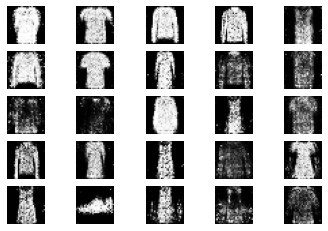

1/1 [==============================] - 0s 91ms/step
13601 [Discriminator loss: 0.426644, acc.: 76.56%] [Generator loss: 1.636178]
1/1 [==============================] - 0s 116ms/step
13602 [Discriminator loss: 0.651223, acc.: 64.06%] [Generator loss: 1.511597]
1/1 [==============================] - 0s 77ms/step
13603 [Discriminator loss: 0.457022, acc.: 81.25%] [Generator loss: 1.628680]
1/1 [==============================] - 0s 75ms/step
13604 [Discriminator loss: 0.517304, acc.: 68.75%] [Generator loss: 1.721137]
1/1 [==============================] - 0s 80ms/step
13605 [Discriminator loss: 0.418244, acc.: 81.25%] [Generator loss: 1.751115]
1/1 [==============================] - 0s 78ms/step
13606 [Discriminator loss: 0.439865, acc.: 82.81%] [Generator loss: 1.555578]
1/1 [==============================] - 0s 78ms/step
13607 [Discriminator loss: 0.433108, acc.: 79.69%] [Generator loss: 1.583754]
1/1 [==============================] - 0s 90ms/step
13608 [Discriminator loss: 0.527991, 

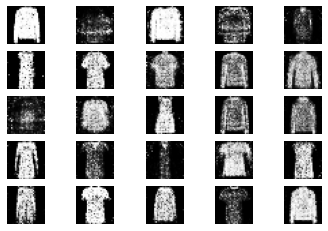

1/1 [==============================] - 0s 143ms/step
13801 [Discriminator loss: 0.398074, acc.: 81.25%] [Generator loss: 1.551440]
1/1 [==============================] - 0s 158ms/step
13802 [Discriminator loss: 0.488461, acc.: 70.31%] [Generator loss: 1.422570]
1/1 [==============================] - 0s 96ms/step
13803 [Discriminator loss: 0.469387, acc.: 79.69%] [Generator loss: 1.659963]
1/1 [==============================] - 0s 111ms/step
13804 [Discriminator loss: 0.613725, acc.: 60.94%] [Generator loss: 1.403949]
1/1 [==============================] - 0s 269ms/step
13805 [Discriminator loss: 0.514894, acc.: 73.44%] [Generator loss: 1.739508]
1/1 [==============================] - 0s 207ms/step
13806 [Discriminator loss: 0.416361, acc.: 78.12%] [Generator loss: 1.668889]
1/1 [==============================] - 0s 339ms/step
13807 [Discriminator loss: 0.571440, acc.: 75.00%] [Generator loss: 1.574847]
1/1 [==============================] - 0s 175ms/step
13808 [Discriminator loss: 0.29

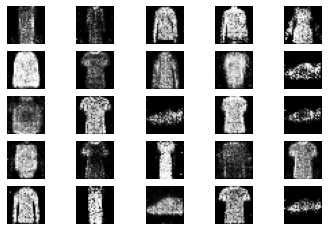

1/1 [==============================] - 0s 153ms/step
14001 [Discriminator loss: 0.407728, acc.: 81.25%] [Generator loss: 1.749358]
1/1 [==============================] - 0s 120ms/step
14002 [Discriminator loss: 0.394519, acc.: 87.50%] [Generator loss: 1.768013]
1/1 [==============================] - 0s 115ms/step
14003 [Discriminator loss: 0.435409, acc.: 78.12%] [Generator loss: 1.875957]
1/1 [==============================] - 0s 120ms/step
14004 [Discriminator loss: 0.488598, acc.: 73.44%] [Generator loss: 1.852908]
1/1 [==============================] - 0s 94ms/step
14005 [Discriminator loss: 0.468058, acc.: 78.12%] [Generator loss: 1.791448]
1/1 [==============================] - 0s 95ms/step
14006 [Discriminator loss: 0.418599, acc.: 81.25%] [Generator loss: 1.682213]
1/1 [==============================] - 0s 109ms/step
14007 [Discriminator loss: 0.478122, acc.: 79.69%] [Generator loss: 1.666810]
1/1 [==============================] - 0s 98ms/step
14008 [Discriminator loss: 0.4477

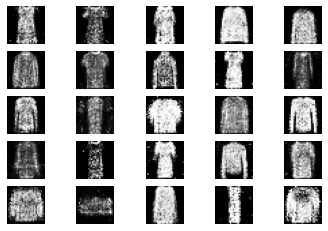

1/1 [==============================] - 0s 110ms/step
14201 [Discriminator loss: 0.480386, acc.: 78.12%] [Generator loss: 1.881704]
1/1 [==============================] - 0s 128ms/step
14202 [Discriminator loss: 0.411579, acc.: 82.81%] [Generator loss: 1.961381]
1/1 [==============================] - 0s 110ms/step
14203 [Discriminator loss: 0.432493, acc.: 75.00%] [Generator loss: 1.724423]
1/1 [==============================] - 0s 94ms/step
14204 [Discriminator loss: 0.570218, acc.: 64.06%] [Generator loss: 1.648937]
1/1 [==============================] - 0s 101ms/step
14205 [Discriminator loss: 0.472816, acc.: 73.44%] [Generator loss: 1.439031]
1/1 [==============================] - 0s 106ms/step
14206 [Discriminator loss: 0.429951, acc.: 73.44%] [Generator loss: 1.625050]
1/1 [==============================] - 0s 101ms/step
14207 [Discriminator loss: 0.489483, acc.: 78.12%] [Generator loss: 1.627166]
1/1 [==============================] - 0s 100ms/step
14208 [Discriminator loss: 0.40

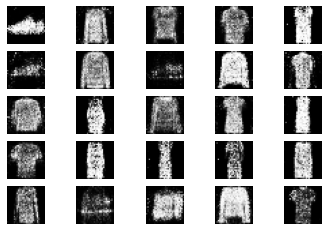

1/1 [==============================] - 0s 124ms/step
14401 [Discriminator loss: 0.488242, acc.: 78.12%] [Generator loss: 1.807117]
1/1 [==============================] - 0s 113ms/step
14402 [Discriminator loss: 0.391606, acc.: 82.81%] [Generator loss: 1.871583]
1/1 [==============================] - 0s 106ms/step
14403 [Discriminator loss: 0.318409, acc.: 92.19%] [Generator loss: 1.825648]
1/1 [==============================] - 0s 107ms/step
14404 [Discriminator loss: 0.415981, acc.: 76.56%] [Generator loss: 1.696804]
1/1 [==============================] - 0s 106ms/step
14405 [Discriminator loss: 0.352442, acc.: 85.94%] [Generator loss: 1.977985]
1/1 [==============================] - 0s 97ms/step
14406 [Discriminator loss: 0.392470, acc.: 84.38%] [Generator loss: 1.784322]
1/1 [==============================] - 0s 100ms/step
14407 [Discriminator loss: 0.524909, acc.: 67.19%] [Generator loss: 1.463708]
1/1 [==============================] - 0s 96ms/step
14408 [Discriminator loss: 0.613

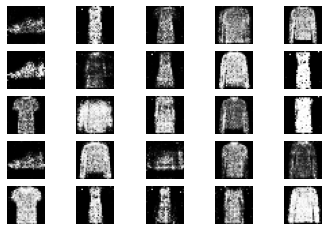

1/1 [==============================] - 0s 132ms/step
14601 [Discriminator loss: 0.489940, acc.: 76.56%] [Generator loss: 1.587726]
1/1 [==============================] - 0s 123ms/step
14602 [Discriminator loss: 0.423065, acc.: 76.56%] [Generator loss: 1.713397]
1/1 [==============================] - 0s 103ms/step
14603 [Discriminator loss: 0.468473, acc.: 78.12%] [Generator loss: 1.714791]
1/1 [==============================] - 0s 96ms/step
14604 [Discriminator loss: 0.406295, acc.: 81.25%] [Generator loss: 1.617474]
1/1 [==============================] - 0s 187ms/step
14605 [Discriminator loss: 0.434081, acc.: 73.44%] [Generator loss: 1.725849]
1/1 [==============================] - 0s 97ms/step
14606 [Discriminator loss: 0.460340, acc.: 75.00%] [Generator loss: 1.715039]
1/1 [==============================] - 0s 101ms/step
14607 [Discriminator loss: 0.348092, acc.: 89.06%] [Generator loss: 1.681607]
1/1 [==============================] - 0s 99ms/step
14608 [Discriminator loss: 0.4087

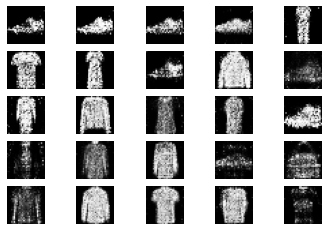

1/1 [==============================] - 0s 111ms/step
14801 [Discriminator loss: 0.447105, acc.: 78.12%] [Generator loss: 1.556356]
1/1 [==============================] - 0s 106ms/step
14802 [Discriminator loss: 0.528218, acc.: 71.88%] [Generator loss: 1.364676]
1/1 [==============================] - 0s 94ms/step
14803 [Discriminator loss: 0.411272, acc.: 79.69%] [Generator loss: 1.738842]
1/1 [==============================] - 0s 88ms/step
14804 [Discriminator loss: 0.477026, acc.: 71.88%] [Generator loss: 1.490415]
1/1 [==============================] - 0s 93ms/step
14805 [Discriminator loss: 0.490203, acc.: 70.31%] [Generator loss: 1.822472]
1/1 [==============================] - 0s 94ms/step
14806 [Discriminator loss: 0.485837, acc.: 71.88%] [Generator loss: 1.769584]
1/1 [==============================] - 0s 88ms/step
14807 [Discriminator loss: 0.498431, acc.: 75.00%] [Generator loss: 1.632324]
1/1 [==============================] - 0s 93ms/step
14808 [Discriminator loss: 0.422836,

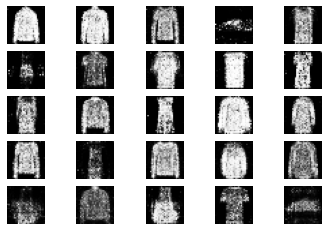

1/1 [==============================] - 0s 101ms/step
15001 [Discriminator loss: 0.382504, acc.: 81.25%] [Generator loss: 1.665219]
1/1 [==============================] - 0s 112ms/step
15002 [Discriminator loss: 0.386559, acc.: 82.81%] [Generator loss: 1.790666]
1/1 [==============================] - 0s 87ms/step
15003 [Discriminator loss: 0.351469, acc.: 87.50%] [Generator loss: 2.005066]
1/1 [==============================] - 0s 93ms/step
15004 [Discriminator loss: 0.551297, acc.: 70.31%] [Generator loss: 2.091302]
1/1 [==============================] - 0s 90ms/step
15005 [Discriminator loss: 0.571235, acc.: 71.88%] [Generator loss: 1.689048]
1/1 [==============================] - 0s 90ms/step
15006 [Discriminator loss: 0.550714, acc.: 67.19%] [Generator loss: 1.664536]
1/1 [==============================] - 0s 117ms/step
15007 [Discriminator loss: 0.440119, acc.: 81.25%] [Generator loss: 1.551784]
1/1 [==============================] - 0s 91ms/step
15008 [Discriminator loss: 0.487932

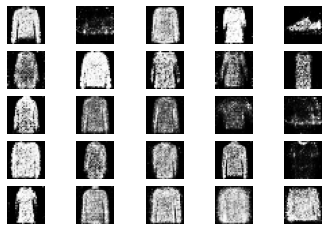

1/1 [==============================] - 0s 98ms/step
15201 [Discriminator loss: 0.506078, acc.: 76.56%] [Generator loss: 1.737464]
1/1 [==============================] - 0s 149ms/step
15202 [Discriminator loss: 0.428529, acc.: 78.12%] [Generator loss: 1.837718]
1/1 [==============================] - 0s 124ms/step
15203 [Discriminator loss: 0.474721, acc.: 70.31%] [Generator loss: 1.747231]
1/1 [==============================] - 0s 91ms/step
15204 [Discriminator loss: 0.406956, acc.: 79.69%] [Generator loss: 1.743514]
1/1 [==============================] - 0s 105ms/step
15205 [Discriminator loss: 0.592966, acc.: 73.44%] [Generator loss: 1.607345]
1/1 [==============================] - 0s 87ms/step
15206 [Discriminator loss: 0.348026, acc.: 82.81%] [Generator loss: 1.718209]
1/1 [==============================] - 0s 101ms/step
15207 [Discriminator loss: 0.457637, acc.: 75.00%] [Generator loss: 1.881900]
1/1 [==============================] - 0s 98ms/step
15208 [Discriminator loss: 0.47388

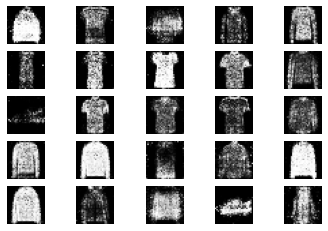

1/1 [==============================] - 0s 121ms/step
15401 [Discriminator loss: 0.532817, acc.: 75.00%] [Generator loss: 1.794116]
1/1 [==============================] - 0s 116ms/step
15402 [Discriminator loss: 0.450671, acc.: 76.56%] [Generator loss: 1.564916]
1/1 [==============================] - 0s 90ms/step
15403 [Discriminator loss: 0.495603, acc.: 73.44%] [Generator loss: 1.563663]
1/1 [==============================] - 0s 120ms/step
15404 [Discriminator loss: 0.470642, acc.: 81.25%] [Generator loss: 1.591010]
1/1 [==============================] - 0s 92ms/step
15405 [Discriminator loss: 0.381167, acc.: 84.38%] [Generator loss: 1.568247]
1/1 [==============================] - 0s 103ms/step
15406 [Discriminator loss: 0.536593, acc.: 75.00%] [Generator loss: 1.768187]
1/1 [==============================] - 0s 90ms/step
15407 [Discriminator loss: 0.606932, acc.: 64.06%] [Generator loss: 1.478869]
1/1 [==============================] - 0s 85ms/step
15408 [Discriminator loss: 0.43773

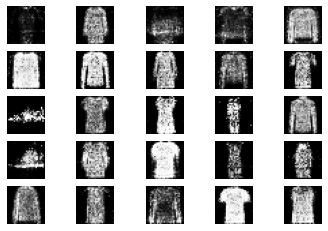

1/1 [==============================] - 0s 150ms/step
15601 [Discriminator loss: 0.512111, acc.: 70.31%] [Generator loss: 1.504182]
1/1 [==============================] - 0s 141ms/step
15602 [Discriminator loss: 0.576849, acc.: 68.75%] [Generator loss: 1.566366]
1/1 [==============================] - 0s 90ms/step
15603 [Discriminator loss: 0.349022, acc.: 82.81%] [Generator loss: 1.581386]
1/1 [==============================] - 0s 102ms/step
15604 [Discriminator loss: 0.468774, acc.: 73.44%] [Generator loss: 1.564944]
1/1 [==============================] - 0s 111ms/step
15605 [Discriminator loss: 0.512854, acc.: 78.12%] [Generator loss: 1.501372]
1/1 [==============================] - 0s 88ms/step
15606 [Discriminator loss: 0.550968, acc.: 68.75%] [Generator loss: 1.744481]
1/1 [==============================] - 0s 99ms/step
15607 [Discriminator loss: 0.481149, acc.: 76.56%] [Generator loss: 1.599779]
1/1 [==============================] - 0s 91ms/step
15608 [Discriminator loss: 0.40079

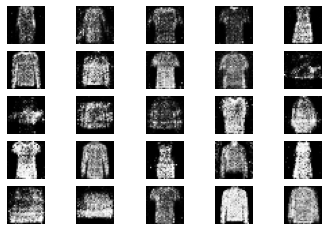

1/1 [==============================] - 0s 131ms/step
15801 [Discriminator loss: 0.382978, acc.: 87.50%] [Generator loss: 1.712197]
1/1 [==============================] - 0s 163ms/step
15802 [Discriminator loss: 0.507754, acc.: 76.56%] [Generator loss: 1.778862]
1/1 [==============================] - 0s 89ms/step
15803 [Discriminator loss: 0.437677, acc.: 82.81%] [Generator loss: 1.810244]
1/1 [==============================] - 0s 90ms/step
15804 [Discriminator loss: 0.541091, acc.: 67.19%] [Generator loss: 1.704981]
1/1 [==============================] - 0s 91ms/step
15805 [Discriminator loss: 0.524831, acc.: 73.44%] [Generator loss: 1.779002]
1/1 [==============================] - 0s 87ms/step
15806 [Discriminator loss: 0.451553, acc.: 79.69%] [Generator loss: 1.704790]
1/1 [==============================] - 0s 108ms/step
15807 [Discriminator loss: 0.569193, acc.: 78.12%] [Generator loss: 1.602554]
1/1 [==============================] - 0s 97ms/step
15808 [Discriminator loss: 0.458164

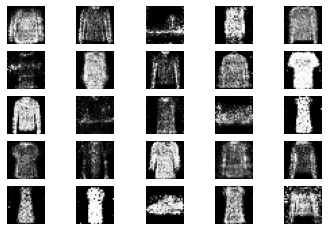

1/1 [==============================] - 0s 110ms/step
16001 [Discriminator loss: 0.469775, acc.: 76.56%] [Generator loss: 1.611604]
1/1 [==============================] - 0s 113ms/step
16002 [Discriminator loss: 0.483340, acc.: 73.44%] [Generator loss: 1.943959]
1/1 [==============================] - 0s 110ms/step
16003 [Discriminator loss: 0.503309, acc.: 70.31%] [Generator loss: 1.586920]
1/1 [==============================] - 0s 112ms/step
16004 [Discriminator loss: 0.533610, acc.: 76.56%] [Generator loss: 1.476508]
1/1 [==============================] - 0s 90ms/step
16005 [Discriminator loss: 0.378216, acc.: 84.38%] [Generator loss: 1.651886]
1/1 [==============================] - 0s 98ms/step
16006 [Discriminator loss: 0.487454, acc.: 81.25%] [Generator loss: 1.697775]
1/1 [==============================] - 0s 98ms/step
16007 [Discriminator loss: 0.425302, acc.: 78.12%] [Generator loss: 1.379688]
1/1 [==============================] - 0s 112ms/step
16008 [Discriminator loss: 0.4117

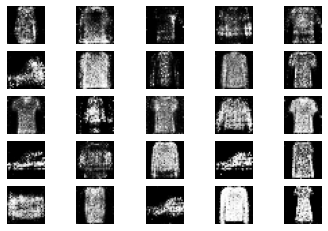

1/1 [==============================] - 0s 93ms/step
16201 [Discriminator loss: 0.530219, acc.: 75.00%] [Generator loss: 1.652937]
1/1 [==============================] - 0s 111ms/step
16202 [Discriminator loss: 0.410703, acc.: 81.25%] [Generator loss: 1.668571]
1/1 [==============================] - 0s 107ms/step
16203 [Discriminator loss: 0.427999, acc.: 78.12%] [Generator loss: 1.578707]
1/1 [==============================] - 0s 93ms/step
16204 [Discriminator loss: 0.442875, acc.: 75.00%] [Generator loss: 1.818603]
1/1 [==============================] - 0s 91ms/step
16205 [Discriminator loss: 0.553166, acc.: 71.88%] [Generator loss: 1.623009]
1/1 [==============================] - 0s 90ms/step
16206 [Discriminator loss: 0.495417, acc.: 76.56%] [Generator loss: 1.662546]
1/1 [==============================] - 0s 90ms/step
16207 [Discriminator loss: 0.412338, acc.: 82.81%] [Generator loss: 1.744804]
1/1 [==============================] - 0s 92ms/step
16208 [Discriminator loss: 0.355315,

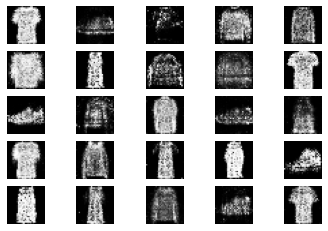

1/1 [==============================] - 0s 112ms/step
16401 [Discriminator loss: 0.383648, acc.: 79.69%] [Generator loss: 1.685707]
1/1 [==============================] - 0s 138ms/step
16402 [Discriminator loss: 0.384025, acc.: 85.94%] [Generator loss: 1.693391]
1/1 [==============================] - 0s 97ms/step
16403 [Discriminator loss: 0.434682, acc.: 78.12%] [Generator loss: 1.745309]
1/1 [==============================] - 0s 96ms/step
16404 [Discriminator loss: 0.458049, acc.: 78.12%] [Generator loss: 1.644246]
1/1 [==============================] - 0s 105ms/step
16405 [Discriminator loss: 0.498672, acc.: 78.12%] [Generator loss: 1.631999]
1/1 [==============================] - 0s 100ms/step
16406 [Discriminator loss: 0.551843, acc.: 78.12%] [Generator loss: 1.603954]
1/1 [==============================] - 0s 107ms/step
16407 [Discriminator loss: 0.454791, acc.: 79.69%] [Generator loss: 1.482862]
1/1 [==============================] - 0s 94ms/step
16408 [Discriminator loss: 0.4362

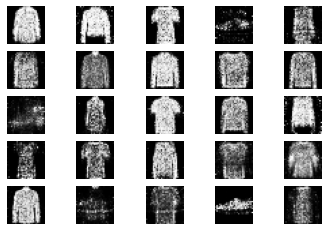

1/1 [==============================] - 0s 104ms/step
16601 [Discriminator loss: 0.502044, acc.: 75.00%] [Generator loss: 1.999318]
1/1 [==============================] - 0s 118ms/step
16602 [Discriminator loss: 0.454728, acc.: 82.81%] [Generator loss: 1.464336]
1/1 [==============================] - 0s 92ms/step
16603 [Discriminator loss: 0.459785, acc.: 73.44%] [Generator loss: 1.471755]
1/1 [==============================] - 0s 117ms/step
16604 [Discriminator loss: 0.433731, acc.: 82.81%] [Generator loss: 1.687418]
1/1 [==============================] - 0s 99ms/step
16605 [Discriminator loss: 0.401780, acc.: 85.94%] [Generator loss: 1.670071]
1/1 [==============================] - 0s 93ms/step
16606 [Discriminator loss: 0.408861, acc.: 82.81%] [Generator loss: 1.388788]
1/1 [==============================] - 0s 115ms/step
16607 [Discriminator loss: 0.489786, acc.: 71.88%] [Generator loss: 1.741942]
1/1 [==============================] - 0s 100ms/step
16608 [Discriminator loss: 0.4683

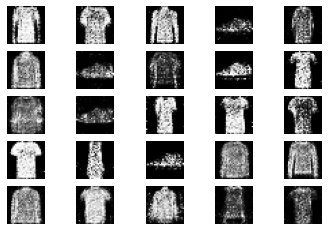

1/1 [==============================] - 0s 109ms/step
16801 [Discriminator loss: 0.494002, acc.: 73.44%] [Generator loss: 1.637998]
1/1 [==============================] - 0s 110ms/step
16802 [Discriminator loss: 0.506928, acc.: 78.12%] [Generator loss: 1.764586]
1/1 [==============================] - 0s 157ms/step
16803 [Discriminator loss: 0.449041, acc.: 81.25%] [Generator loss: 1.519064]
1/1 [==============================] - 0s 94ms/step
16804 [Discriminator loss: 0.428318, acc.: 79.69%] [Generator loss: 1.554775]
1/1 [==============================] - 0s 93ms/step
16805 [Discriminator loss: 0.410829, acc.: 76.56%] [Generator loss: 1.594488]
1/1 [==============================] - 0s 91ms/step
16806 [Discriminator loss: 0.502362, acc.: 71.88%] [Generator loss: 1.630354]
1/1 [==============================] - 0s 108ms/step
16807 [Discriminator loss: 0.489761, acc.: 73.44%] [Generator loss: 1.650337]
1/1 [==============================] - 0s 91ms/step
16808 [Discriminator loss: 0.54004

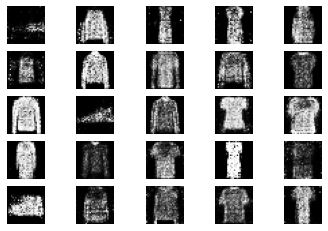

1/1 [==============================] - 0s 130ms/step
17001 [Discriminator loss: 0.449096, acc.: 78.12%] [Generator loss: 1.713397]
1/1 [==============================] - 0s 125ms/step
17002 [Discriminator loss: 0.390457, acc.: 81.25%] [Generator loss: 1.789718]
1/1 [==============================] - 0s 115ms/step
17003 [Discriminator loss: 0.574262, acc.: 68.75%] [Generator loss: 1.764539]
1/1 [==============================] - 0s 112ms/step
17004 [Discriminator loss: 0.490496, acc.: 76.56%] [Generator loss: 1.733261]
1/1 [==============================] - 0s 99ms/step
17005 [Discriminator loss: 0.409211, acc.: 82.81%] [Generator loss: 2.148204]
1/1 [==============================] - 0s 108ms/step
17006 [Discriminator loss: 0.605350, acc.: 70.31%] [Generator loss: 1.696483]
1/1 [==============================] - 0s 96ms/step
17007 [Discriminator loss: 0.389348, acc.: 81.25%] [Generator loss: 1.912815]
1/1 [==============================] - 0s 104ms/step
17008 [Discriminator loss: 0.472

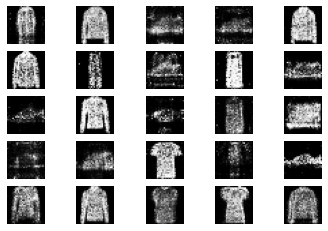

1/1 [==============================] - 0s 103ms/step
17201 [Discriminator loss: 0.399679, acc.: 85.94%] [Generator loss: 1.682404]
1/1 [==============================] - 0s 175ms/step
17202 [Discriminator loss: 0.496001, acc.: 78.12%] [Generator loss: 1.475895]
1/1 [==============================] - 0s 95ms/step
17203 [Discriminator loss: 0.354735, acc.: 81.25%] [Generator loss: 1.682009]
1/1 [==============================] - 0s 95ms/step
17204 [Discriminator loss: 0.438575, acc.: 79.69%] [Generator loss: 1.697388]
1/1 [==============================] - 0s 98ms/step
17205 [Discriminator loss: 0.543642, acc.: 75.00%] [Generator loss: 1.653229]
1/1 [==============================] - 0s 99ms/step
17206 [Discriminator loss: 0.434846, acc.: 78.12%] [Generator loss: 1.527916]
1/1 [==============================] - 0s 101ms/step
17207 [Discriminator loss: 0.449983, acc.: 76.56%] [Generator loss: 1.551433]
1/1 [==============================] - 0s 97ms/step
17208 [Discriminator loss: 0.462219

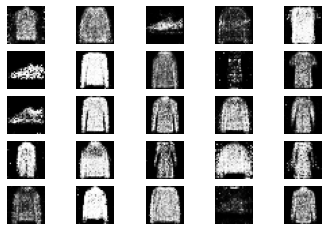

1/1 [==============================] - 0s 103ms/step
17401 [Discriminator loss: 0.451781, acc.: 76.56%] [Generator loss: 1.515347]
1/1 [==============================] - 0s 203ms/step
17402 [Discriminator loss: 0.503462, acc.: 75.00%] [Generator loss: 1.694152]
1/1 [==============================] - 0s 108ms/step
17403 [Discriminator loss: 0.369088, acc.: 89.06%] [Generator loss: 1.691584]
1/1 [==============================] - 0s 115ms/step
17404 [Discriminator loss: 0.433751, acc.: 82.81%] [Generator loss: 1.714504]
1/1 [==============================] - 0s 96ms/step
17405 [Discriminator loss: 0.426930, acc.: 75.00%] [Generator loss: 1.683181]
1/1 [==============================] - 0s 93ms/step
17406 [Discriminator loss: 0.581551, acc.: 64.06%] [Generator loss: 1.560630]
1/1 [==============================] - 0s 110ms/step
17407 [Discriminator loss: 0.415835, acc.: 81.25%] [Generator loss: 1.477028]
1/1 [==============================] - 0s 106ms/step
17408 [Discriminator loss: 0.431

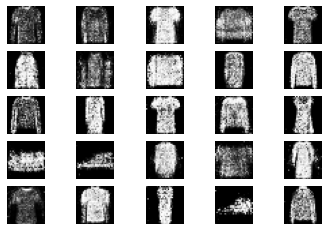

1/1 [==============================] - 0s 124ms/step
17601 [Discriminator loss: 0.521181, acc.: 78.12%] [Generator loss: 1.879856]
1/1 [==============================] - 0s 108ms/step
17602 [Discriminator loss: 0.451869, acc.: 79.69%] [Generator loss: 1.723562]
1/1 [==============================] - 0s 111ms/step
17603 [Discriminator loss: 0.439949, acc.: 82.81%] [Generator loss: 1.551858]
1/1 [==============================] - 0s 105ms/step
17604 [Discriminator loss: 0.448323, acc.: 76.56%] [Generator loss: 1.841805]
1/1 [==============================] - 0s 91ms/step
17605 [Discriminator loss: 0.433438, acc.: 73.44%] [Generator loss: 1.969500]
1/1 [==============================] - 0s 92ms/step
17606 [Discriminator loss: 0.539806, acc.: 71.88%] [Generator loss: 1.440653]
1/1 [==============================] - 0s 113ms/step
17607 [Discriminator loss: 0.472296, acc.: 73.44%] [Generator loss: 1.715401]
1/1 [==============================] - 0s 101ms/step
17608 [Discriminator loss: 0.632

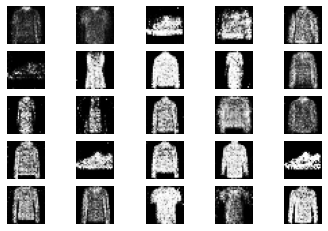

1/1 [==============================] - 0s 113ms/step
17801 [Discriminator loss: 0.544232, acc.: 71.88%] [Generator loss: 1.773417]
1/1 [==============================] - 0s 161ms/step
17802 [Discriminator loss: 0.474380, acc.: 81.25%] [Generator loss: 1.833684]
1/1 [==============================] - 0s 135ms/step
17803 [Discriminator loss: 0.424464, acc.: 81.25%] [Generator loss: 1.929121]
1/1 [==============================] - 0s 95ms/step
17804 [Discriminator loss: 0.405800, acc.: 82.81%] [Generator loss: 1.659186]
1/1 [==============================] - 0s 96ms/step
17805 [Discriminator loss: 0.531521, acc.: 68.75%] [Generator loss: 1.547662]
1/1 [==============================] - 0s 125ms/step
17806 [Discriminator loss: 0.629772, acc.: 68.75%] [Generator loss: 1.408157]
1/1 [==============================] - 0s 91ms/step
17807 [Discriminator loss: 0.397765, acc.: 81.25%] [Generator loss: 1.676506]
1/1 [==============================] - 0s 148ms/step
17808 [Discriminator loss: 0.4776

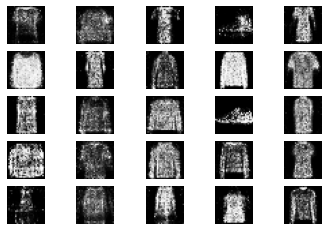

1/1 [==============================] - 0s 132ms/step
18001 [Discriminator loss: 0.443257, acc.: 79.69%] [Generator loss: 1.740343]
1/1 [==============================] - 0s 277ms/step
18002 [Discriminator loss: 0.461474, acc.: 75.00%] [Generator loss: 1.853236]
1/1 [==============================] - 0s 97ms/step
18003 [Discriminator loss: 0.510671, acc.: 76.56%] [Generator loss: 1.776055]
1/1 [==============================] - 0s 97ms/step
18004 [Discriminator loss: 0.409729, acc.: 81.25%] [Generator loss: 1.962785]
1/1 [==============================] - 0s 172ms/step
18005 [Discriminator loss: 0.640361, acc.: 65.62%] [Generator loss: 1.486524]
1/1 [==============================] - 0s 97ms/step
18006 [Discriminator loss: 0.395241, acc.: 81.25%] [Generator loss: 1.158513]
1/1 [==============================] - 0s 95ms/step
18007 [Discriminator loss: 0.467731, acc.: 75.00%] [Generator loss: 1.680777]
1/1 [==============================] - 0s 98ms/step
18008 [Discriminator loss: 0.398524

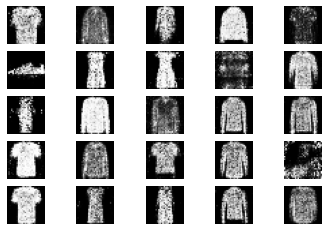

1/1 [==============================] - 0s 229ms/step
18201 [Discriminator loss: 0.418429, acc.: 76.56%] [Generator loss: 1.741140]
1/1 [==============================] - 0s 209ms/step
18202 [Discriminator loss: 0.421605, acc.: 79.69%] [Generator loss: 1.674204]
1/1 [==============================] - 0s 95ms/step
18203 [Discriminator loss: 0.480036, acc.: 71.88%] [Generator loss: 1.728223]
1/1 [==============================] - 0s 142ms/step
18204 [Discriminator loss: 0.382169, acc.: 79.69%] [Generator loss: 1.704332]
1/1 [==============================] - 0s 107ms/step
18205 [Discriminator loss: 0.533378, acc.: 68.75%] [Generator loss: 1.663701]
1/1 [==============================] - 0s 158ms/step
18206 [Discriminator loss: 0.522989, acc.: 73.44%] [Generator loss: 1.715796]
1/1 [==============================] - 0s 115ms/step
18207 [Discriminator loss: 0.453526, acc.: 82.81%] [Generator loss: 1.628404]
1/1 [==============================] - 0s 106ms/step
18208 [Discriminator loss: 0.43

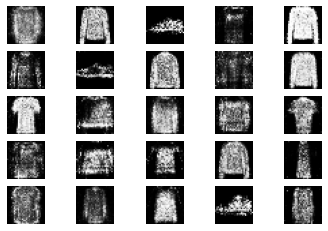

1/1 [==============================] - 0s 164ms/step
18401 [Discriminator loss: 0.384220, acc.: 81.25%] [Generator loss: 1.700446]
1/1 [==============================] - 0s 121ms/step
18402 [Discriminator loss: 0.533495, acc.: 75.00%] [Generator loss: 1.579478]
1/1 [==============================] - 0s 223ms/step
18403 [Discriminator loss: 0.586330, acc.: 78.12%] [Generator loss: 1.793894]
1/1 [==============================] - 0s 96ms/step
18404 [Discriminator loss: 0.521806, acc.: 75.00%] [Generator loss: 1.512923]
1/1 [==============================] - 0s 96ms/step
18405 [Discriminator loss: 0.483839, acc.: 76.56%] [Generator loss: 1.860320]
1/1 [==============================] - 0s 111ms/step
18406 [Discriminator loss: 0.419519, acc.: 82.81%] [Generator loss: 1.743933]
1/1 [==============================] - 0s 104ms/step
18407 [Discriminator loss: 0.525542, acc.: 71.88%] [Generator loss: 1.524940]
1/1 [==============================] - 0s 97ms/step
18408 [Discriminator loss: 0.3777

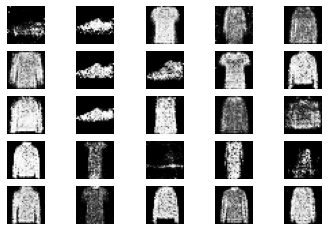

1/1 [==============================] - 0s 180ms/step
18601 [Discriminator loss: 0.489009, acc.: 73.44%] [Generator loss: 1.496585]
1/1 [==============================] - 0s 184ms/step
18602 [Discriminator loss: 0.381181, acc.: 84.38%] [Generator loss: 1.804730]
1/1 [==============================] - 0s 135ms/step
18603 [Discriminator loss: 0.370911, acc.: 82.81%] [Generator loss: 2.108133]
1/1 [==============================] - 0s 98ms/step
18604 [Discriminator loss: 0.462632, acc.: 78.12%] [Generator loss: 1.817169]
1/1 [==============================] - 0s 113ms/step
18605 [Discriminator loss: 0.592538, acc.: 65.62%] [Generator loss: 1.784733]
1/1 [==============================] - 0s 101ms/step
18606 [Discriminator loss: 0.379564, acc.: 81.25%] [Generator loss: 1.927259]
1/1 [==============================] - 0s 99ms/step
18607 [Discriminator loss: 0.441517, acc.: 75.00%] [Generator loss: 1.762931]
1/1 [==============================] - 0s 95ms/step
18608 [Discriminator loss: 0.4571

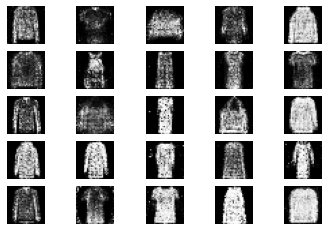

1/1 [==============================] - 0s 159ms/step
18801 [Discriminator loss: 0.456534, acc.: 79.69%] [Generator loss: 1.544224]
1/1 [==============================] - 0s 216ms/step
18802 [Discriminator loss: 0.440747, acc.: 78.12%] [Generator loss: 1.605577]
1/1 [==============================] - 0s 97ms/step
18803 [Discriminator loss: 0.277093, acc.: 90.62%] [Generator loss: 1.602044]
1/1 [==============================] - 0s 118ms/step
18804 [Discriminator loss: 0.507260, acc.: 73.44%] [Generator loss: 1.851511]
1/1 [==============================] - 0s 97ms/step
18805 [Discriminator loss: 0.498211, acc.: 76.56%] [Generator loss: 1.965403]
1/1 [==============================] - 0s 111ms/step
18806 [Discriminator loss: 0.415714, acc.: 82.81%] [Generator loss: 2.116934]
1/1 [==============================] - 0s 148ms/step
18807 [Discriminator loss: 0.387258, acc.: 81.25%] [Generator loss: 1.956963]
1/1 [==============================] - 0s 109ms/step
18808 [Discriminator loss: 0.613

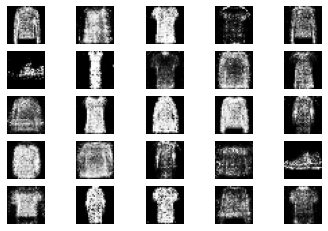

1/1 [==============================] - 0s 194ms/step
19001 [Discriminator loss: 0.482040, acc.: 71.88%] [Generator loss: 1.423749]
1/1 [==============================] - 0s 209ms/step
19002 [Discriminator loss: 0.470549, acc.: 78.12%] [Generator loss: 1.623422]
1/1 [==============================] - 0s 112ms/step
19003 [Discriminator loss: 0.511468, acc.: 73.44%] [Generator loss: 1.610929]
1/1 [==============================] - 0s 125ms/step
19004 [Discriminator loss: 0.394861, acc.: 89.06%] [Generator loss: 1.608096]
1/1 [==============================] - 0s 111ms/step
19005 [Discriminator loss: 0.348889, acc.: 82.81%] [Generator loss: 1.857588]
1/1 [==============================] - 0s 112ms/step
19006 [Discriminator loss: 0.540372, acc.: 78.12%] [Generator loss: 1.641863]
1/1 [==============================] - 0s 111ms/step
19007 [Discriminator loss: 0.466555, acc.: 76.56%] [Generator loss: 1.754955]
1/1 [==============================] - 0s 117ms/step
19008 [Discriminator loss: 0.4

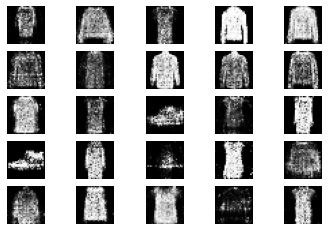

1/1 [==============================] - 0s 130ms/step
19201 [Discriminator loss: 0.491751, acc.: 73.44%] [Generator loss: 1.464295]
1/1 [==============================] - 0s 127ms/step
19202 [Discriminator loss: 0.526074, acc.: 68.75%] [Generator loss: 1.716490]
1/1 [==============================] - 0s 121ms/step
19203 [Discriminator loss: 0.372166, acc.: 82.81%] [Generator loss: 1.955972]
1/1 [==============================] - 0s 121ms/step
19204 [Discriminator loss: 0.444462, acc.: 76.56%] [Generator loss: 1.800564]
1/1 [==============================] - 0s 144ms/step
19205 [Discriminator loss: 0.337167, acc.: 84.38%] [Generator loss: 1.601939]
1/1 [==============================] - 0s 132ms/step
19206 [Discriminator loss: 0.436505, acc.: 79.69%] [Generator loss: 1.798984]
1/1 [==============================] - 0s 133ms/step
19207 [Discriminator loss: 0.557517, acc.: 73.44%] [Generator loss: 1.635831]
1/1 [==============================] - 0s 209ms/step
19208 [Discriminator loss: 0.3

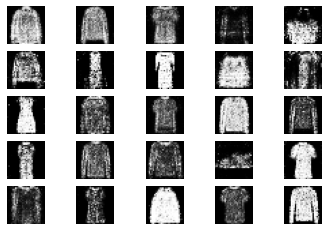

1/1 [==============================] - 0s 126ms/step
19401 [Discriminator loss: 0.401743, acc.: 85.94%] [Generator loss: 2.014849]
1/1 [==============================] - 0s 179ms/step
19402 [Discriminator loss: 0.489460, acc.: 76.56%] [Generator loss: 1.876199]
1/1 [==============================] - 0s 134ms/step
19403 [Discriminator loss: 0.580957, acc.: 70.31%] [Generator loss: 1.478574]
1/1 [==============================] - 0s 154ms/step
19404 [Discriminator loss: 0.612380, acc.: 68.75%] [Generator loss: 1.423616]
1/1 [==============================] - 0s 120ms/step
19405 [Discriminator loss: 0.372463, acc.: 84.38%] [Generator loss: 1.416635]
1/1 [==============================] - 0s 130ms/step
19406 [Discriminator loss: 0.403671, acc.: 82.81%] [Generator loss: 1.671088]
1/1 [==============================] - 0s 129ms/step
19407 [Discriminator loss: 0.425555, acc.: 75.00%] [Generator loss: 1.683164]
1/1 [==============================] - 0s 128ms/step
19408 [Discriminator loss: 0.4

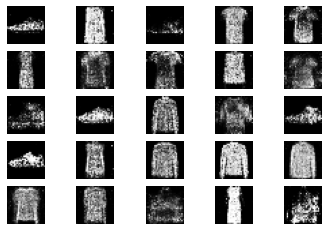

1/1 [==============================] - 0s 147ms/step
19601 [Discriminator loss: 0.493007, acc.: 79.69%] [Generator loss: 1.656950]
1/1 [==============================] - 0s 134ms/step
19602 [Discriminator loss: 0.433042, acc.: 81.25%] [Generator loss: 1.931985]
1/1 [==============================] - 0s 121ms/step
19603 [Discriminator loss: 0.496319, acc.: 76.56%] [Generator loss: 1.710654]
1/1 [==============================] - 0s 210ms/step
19604 [Discriminator loss: 0.469965, acc.: 78.12%] [Generator loss: 1.792726]
1/1 [==============================] - 0s 137ms/step
19605 [Discriminator loss: 0.431952, acc.: 79.69%] [Generator loss: 1.697139]
1/1 [==============================] - 0s 143ms/step
19606 [Discriminator loss: 0.504597, acc.: 73.44%] [Generator loss: 1.800008]
1/1 [==============================] - 0s 119ms/step
19607 [Discriminator loss: 0.412764, acc.: 82.81%] [Generator loss: 1.815513]
1/1 [==============================] - 0s 149ms/step
19608 [Discriminator loss: 0.4

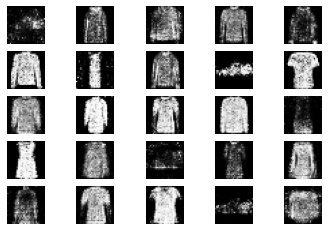

1/1 [==============================] - 0s 115ms/step
19801 [Discriminator loss: 0.431784, acc.: 78.12%] [Generator loss: 1.756612]
1/1 [==============================] - 0s 168ms/step
19802 [Discriminator loss: 0.479612, acc.: 81.25%] [Generator loss: 1.594455]
1/1 [==============================] - 0s 126ms/step
19803 [Discriminator loss: 0.571761, acc.: 71.88%] [Generator loss: 1.414825]
1/1 [==============================] - 0s 144ms/step
19804 [Discriminator loss: 0.400041, acc.: 81.25%] [Generator loss: 1.438966]
1/1 [==============================] - 0s 122ms/step
19805 [Discriminator loss: 0.492377, acc.: 73.44%] [Generator loss: 1.431799]
1/1 [==============================] - 0s 157ms/step
19806 [Discriminator loss: 0.418214, acc.: 85.94%] [Generator loss: 1.616459]
1/1 [==============================] - 0s 113ms/step
19807 [Discriminator loss: 0.466014, acc.: 75.00%] [Generator loss: 1.687898]
1/1 [==============================] - 0s 160ms/step
19808 [Discriminator loss: 0.4

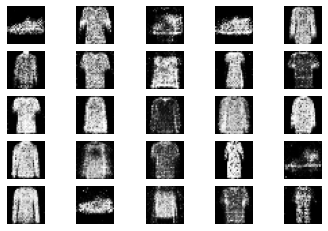

1/1 [==============================] - 0s 141ms/step
20001 [Discriminator loss: 0.453783, acc.: 75.00%] [Generator loss: 1.456518]
1/1 [==============================] - 0s 199ms/step
20002 [Discriminator loss: 0.462467, acc.: 78.12%] [Generator loss: 1.484799]
1/1 [==============================] - 0s 118ms/step
20003 [Discriminator loss: 0.486409, acc.: 75.00%] [Generator loss: 1.437763]
1/1 [==============================] - 0s 137ms/step
20004 [Discriminator loss: 0.410835, acc.: 87.50%] [Generator loss: 1.535543]
1/1 [==============================] - 0s 181ms/step
20005 [Discriminator loss: 0.355405, acc.: 85.94%] [Generator loss: 1.580745]
1/1 [==============================] - 0s 122ms/step
20006 [Discriminator loss: 0.499744, acc.: 71.88%] [Generator loss: 1.878877]
1/1 [==============================] - 0s 125ms/step
20007 [Discriminator loss: 0.421741, acc.: 78.12%] [Generator loss: 1.697520]
1/1 [==============================] - 0s 137ms/step
20008 [Discriminator loss: 0.4

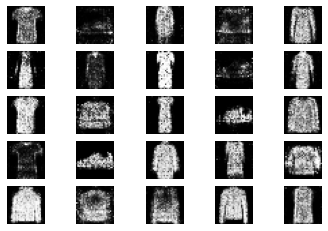

1/1 [==============================] - 0s 120ms/step
20201 [Discriminator loss: 0.448991, acc.: 75.00%] [Generator loss: 1.826120]
1/1 [==============================] - 0s 136ms/step
20202 [Discriminator loss: 0.499317, acc.: 73.44%] [Generator loss: 1.582093]
1/1 [==============================] - 0s 140ms/step
20203 [Discriminator loss: 0.543059, acc.: 75.00%] [Generator loss: 1.638755]
1/1 [==============================] - 0s 123ms/step
20204 [Discriminator loss: 0.411605, acc.: 82.81%] [Generator loss: 1.777195]
1/1 [==============================] - 0s 124ms/step
20205 [Discriminator loss: 0.340353, acc.: 82.81%] [Generator loss: 1.643865]
1/1 [==============================] - 0s 117ms/step
20206 [Discriminator loss: 0.506690, acc.: 71.88%] [Generator loss: 1.827183]
1/1 [==============================] - 0s 135ms/step
20207 [Discriminator loss: 0.421920, acc.: 78.12%] [Generator loss: 1.575238]
1/1 [==============================] - 0s 137ms/step
20208 [Discriminator loss: 0.6

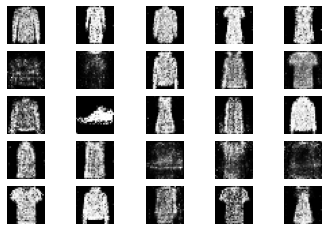

1/1 [==============================] - 0s 123ms/step
20401 [Discriminator loss: 0.493762, acc.: 73.44%] [Generator loss: 1.605727]
1/1 [==============================] - 0s 200ms/step
20402 [Discriminator loss: 0.369633, acc.: 84.38%] [Generator loss: 1.784580]
1/1 [==============================] - 0s 176ms/step
20403 [Discriminator loss: 0.402686, acc.: 85.94%] [Generator loss: 1.623112]
1/1 [==============================] - 0s 179ms/step
20404 [Discriminator loss: 0.418600, acc.: 79.69%] [Generator loss: 1.821979]
1/1 [==============================] - 0s 252ms/step
20405 [Discriminator loss: 0.403081, acc.: 85.94%] [Generator loss: 1.976253]
1/1 [==============================] - 0s 159ms/step
20406 [Discriminator loss: 0.581729, acc.: 73.44%] [Generator loss: 1.736731]
1/1 [==============================] - 0s 225ms/step
20407 [Discriminator loss: 0.572102, acc.: 70.31%] [Generator loss: 1.547502]
1/1 [==============================] - 0s 320ms/step
20408 [Discriminator loss: 0.3

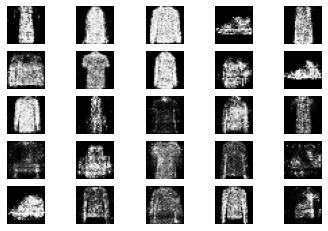

1/1 [==============================] - 0s 172ms/step
20601 [Discriminator loss: 0.376443, acc.: 81.25%] [Generator loss: 1.828287]
1/1 [==============================] - 0s 181ms/step
20602 [Discriminator loss: 0.518505, acc.: 76.56%] [Generator loss: 1.811748]
1/1 [==============================] - 0s 125ms/step
20603 [Discriminator loss: 0.484630, acc.: 79.69%] [Generator loss: 1.892941]
1/1 [==============================] - 0s 223ms/step
20604 [Discriminator loss: 0.422801, acc.: 79.69%] [Generator loss: 1.743581]
1/1 [==============================] - 0s 133ms/step
20605 [Discriminator loss: 0.500605, acc.: 73.44%] [Generator loss: 1.796255]
1/1 [==============================] - 0s 162ms/step
20606 [Discriminator loss: 0.391379, acc.: 84.38%] [Generator loss: 1.806112]
1/1 [==============================] - 0s 228ms/step
20607 [Discriminator loss: 0.316797, acc.: 87.50%] [Generator loss: 2.112795]
1/1 [==============================] - 0s 149ms/step
20608 [Discriminator loss: 0.4

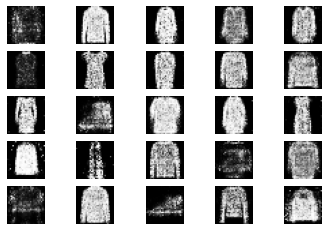

1/1 [==============================] - 0s 164ms/step
20801 [Discriminator loss: 0.510201, acc.: 71.88%] [Generator loss: 1.719211]
1/1 [==============================] - 0s 131ms/step
20802 [Discriminator loss: 0.435858, acc.: 79.69%] [Generator loss: 1.675877]
1/1 [==============================] - 0s 135ms/step
20803 [Discriminator loss: 0.431158, acc.: 78.12%] [Generator loss: 1.517052]
1/1 [==============================] - 0s 178ms/step
20804 [Discriminator loss: 0.459093, acc.: 76.56%] [Generator loss: 1.904255]
1/1 [==============================] - 0s 143ms/step
20805 [Discriminator loss: 0.453927, acc.: 79.69%] [Generator loss: 1.837573]
1/1 [==============================] - 0s 116ms/step
20806 [Discriminator loss: 0.514353, acc.: 73.44%] [Generator loss: 1.732613]
1/1 [==============================] - 0s 141ms/step
20807 [Discriminator loss: 0.476429, acc.: 76.56%] [Generator loss: 1.922165]
1/1 [==============================] - 0s 117ms/step
20808 [Discriminator loss: 0.4

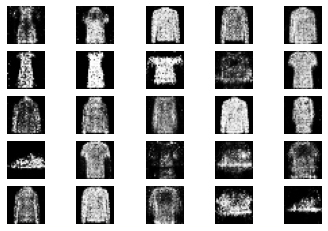

1/1 [==============================] - 0s 130ms/step
21001 [Discriminator loss: 0.415999, acc.: 79.69%] [Generator loss: 1.861135]
1/1 [==============================] - 0s 275ms/step
21002 [Discriminator loss: 0.506911, acc.: 70.31%] [Generator loss: 1.843479]
1/1 [==============================] - 0s 121ms/step
21003 [Discriminator loss: 0.430927, acc.: 81.25%] [Generator loss: 1.732813]
1/1 [==============================] - 0s 135ms/step
21004 [Discriminator loss: 0.489738, acc.: 73.44%] [Generator loss: 1.660086]
1/1 [==============================] - 0s 116ms/step
21005 [Discriminator loss: 0.481952, acc.: 73.44%] [Generator loss: 1.548275]
1/1 [==============================] - 0s 142ms/step
21006 [Discriminator loss: 0.526542, acc.: 71.88%] [Generator loss: 1.493675]
1/1 [==============================] - 0s 130ms/step
21007 [Discriminator loss: 0.496251, acc.: 73.44%] [Generator loss: 1.444248]
1/1 [==============================] - 0s 149ms/step
21008 [Discriminator loss: 0.4

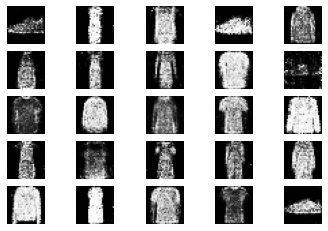

1/1 [==============================] - 0s 224ms/step
21201 [Discriminator loss: 0.525062, acc.: 71.88%] [Generator loss: 1.895140]
1/1 [==============================] - 0s 184ms/step
21202 [Discriminator loss: 0.406920, acc.: 82.81%] [Generator loss: 2.081819]
1/1 [==============================] - 0s 142ms/step
21203 [Discriminator loss: 0.418225, acc.: 78.12%] [Generator loss: 1.652115]
1/1 [==============================] - 0s 292ms/step
21204 [Discriminator loss: 0.520357, acc.: 73.44%] [Generator loss: 1.762841]
1/1 [==============================] - 0s 165ms/step
21205 [Discriminator loss: 0.444355, acc.: 76.56%] [Generator loss: 1.556775]
1/1 [==============================] - 0s 111ms/step
21206 [Discriminator loss: 0.420830, acc.: 76.56%] [Generator loss: 1.404979]
1/1 [==============================] - 0s 134ms/step
21207 [Discriminator loss: 0.538145, acc.: 73.44%] [Generator loss: 1.844185]
1/1 [==============================] - 0s 190ms/step
21208 [Discriminator loss: 0.5

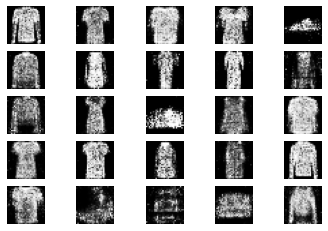

1/1 [==============================] - 0s 114ms/step
21401 [Discriminator loss: 0.378596, acc.: 79.69%] [Generator loss: 1.698429]
1/1 [==============================] - 0s 133ms/step
21402 [Discriminator loss: 0.359675, acc.: 89.06%] [Generator loss: 1.722014]
1/1 [==============================] - 0s 216ms/step
21403 [Discriminator loss: 0.377389, acc.: 82.81%] [Generator loss: 1.726417]
1/1 [==============================] - 0s 125ms/step
21404 [Discriminator loss: 0.445704, acc.: 81.25%] [Generator loss: 1.933047]
1/1 [==============================] - 0s 202ms/step
21405 [Discriminator loss: 0.555565, acc.: 73.44%] [Generator loss: 1.542160]
1/1 [==============================] - 0s 137ms/step
21406 [Discriminator loss: 0.470094, acc.: 76.56%] [Generator loss: 1.556779]
1/1 [==============================] - 0s 138ms/step
21407 [Discriminator loss: 0.381313, acc.: 82.81%] [Generator loss: 1.615438]
1/1 [==============================] - 0s 133ms/step
21408 [Discriminator loss: 0.3

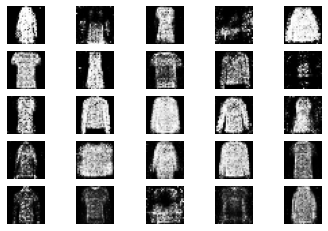

1/1 [==============================] - 0s 152ms/step
21601 [Discriminator loss: 0.402308, acc.: 79.69%] [Generator loss: 1.836542]
1/1 [==============================] - 0s 156ms/step
21602 [Discriminator loss: 0.387589, acc.: 79.69%] [Generator loss: 1.912496]
1/1 [==============================] - 0s 155ms/step
21603 [Discriminator loss: 0.524372, acc.: 71.88%] [Generator loss: 2.028598]
1/1 [==============================] - 0s 148ms/step
21604 [Discriminator loss: 0.337943, acc.: 89.06%] [Generator loss: 1.797273]
1/1 [==============================] - 0s 172ms/step
21605 [Discriminator loss: 0.384277, acc.: 82.81%] [Generator loss: 1.875476]
1/1 [==============================] - 0s 284ms/step
21606 [Discriminator loss: 0.458304, acc.: 82.81%] [Generator loss: 1.891766]
1/1 [==============================] - 0s 164ms/step
21607 [Discriminator loss: 0.449341, acc.: 78.12%] [Generator loss: 1.821244]
1/1 [==============================] - 0s 172ms/step
21608 [Discriminator loss: 0.5

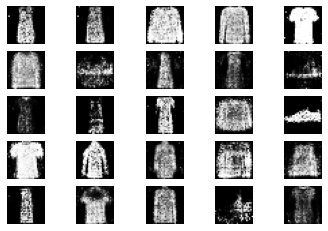

1/1 [==============================] - 0s 159ms/step
21801 [Discriminator loss: 0.399423, acc.: 81.25%] [Generator loss: 1.884234]
1/1 [==============================] - 0s 124ms/step
21802 [Discriminator loss: 0.462088, acc.: 79.69%] [Generator loss: 1.596764]
1/1 [==============================] - 0s 115ms/step
21803 [Discriminator loss: 0.480634, acc.: 78.12%] [Generator loss: 1.780928]
1/1 [==============================] - 0s 204ms/step
21804 [Discriminator loss: 0.389884, acc.: 82.81%] [Generator loss: 1.789817]
1/1 [==============================] - 0s 111ms/step
21805 [Discriminator loss: 0.465702, acc.: 78.12%] [Generator loss: 1.486990]
1/1 [==============================] - 0s 124ms/step
21806 [Discriminator loss: 0.476721, acc.: 73.44%] [Generator loss: 1.461757]
1/1 [==============================] - 0s 113ms/step
21807 [Discriminator loss: 0.524073, acc.: 76.56%] [Generator loss: 1.927205]
1/1 [==============================] - 0s 132ms/step
21808 [Discriminator loss: 0.4

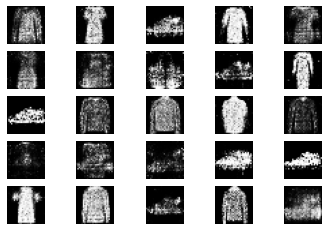

1/1 [==============================] - 0s 191ms/step
22001 [Discriminator loss: 0.540244, acc.: 73.44%] [Generator loss: 1.633654]
1/1 [==============================] - 0s 198ms/step
22002 [Discriminator loss: 0.557404, acc.: 73.44%] [Generator loss: 1.709751]
1/1 [==============================] - 0s 201ms/step
22003 [Discriminator loss: 0.513894, acc.: 70.31%] [Generator loss: 1.609040]
1/1 [==============================] - 0s 194ms/step
22004 [Discriminator loss: 0.491531, acc.: 76.56%] [Generator loss: 1.674934]
1/1 [==============================] - 0s 195ms/step
22005 [Discriminator loss: 0.510854, acc.: 78.12%] [Generator loss: 1.817588]
1/1 [==============================] - 0s 271ms/step
22006 [Discriminator loss: 0.617970, acc.: 71.88%] [Generator loss: 1.789466]
1/1 [==============================] - 0s 197ms/step
22007 [Discriminator loss: 0.511676, acc.: 75.00%] [Generator loss: 1.739288]
1/1 [==============================] - 0s 177ms/step
22008 [Discriminator loss: 0.4

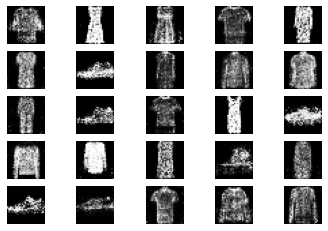

1/1 [==============================] - 0s 110ms/step
22201 [Discriminator loss: 0.487394, acc.: 76.56%] [Generator loss: 1.745504]
1/1 [==============================] - 0s 134ms/step
22202 [Discriminator loss: 0.432071, acc.: 78.12%] [Generator loss: 1.856243]
1/1 [==============================] - 0s 105ms/step
22203 [Discriminator loss: 0.424555, acc.: 78.12%] [Generator loss: 1.743940]
1/1 [==============================] - 0s 117ms/step
22204 [Discriminator loss: 0.506968, acc.: 78.12%] [Generator loss: 1.799932]
1/1 [==============================] - 0s 107ms/step
22205 [Discriminator loss: 0.438468, acc.: 82.81%] [Generator loss: 1.612928]
1/1 [==============================] - 0s 148ms/step
22206 [Discriminator loss: 0.615131, acc.: 64.06%] [Generator loss: 1.489207]
1/1 [==============================] - 0s 109ms/step
22207 [Discriminator loss: 0.429618, acc.: 82.81%] [Generator loss: 1.436724]
1/1 [==============================] - 0s 116ms/step
22208 [Discriminator loss: 0.3

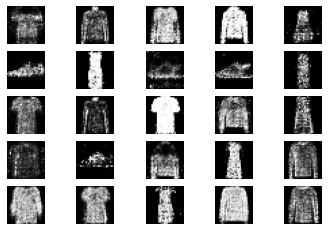

1/1 [==============================] - 0s 162ms/step
22401 [Discriminator loss: 0.478022, acc.: 75.00%] [Generator loss: 1.583039]
1/1 [==============================] - 0s 125ms/step
22402 [Discriminator loss: 0.478198, acc.: 78.12%] [Generator loss: 1.969023]
1/1 [==============================] - 0s 107ms/step
22403 [Discriminator loss: 0.362880, acc.: 85.94%] [Generator loss: 2.132977]
1/1 [==============================] - 0s 116ms/step
22404 [Discriminator loss: 0.459859, acc.: 78.12%] [Generator loss: 2.248799]
1/1 [==============================] - 0s 116ms/step
22405 [Discriminator loss: 0.555429, acc.: 71.88%] [Generator loss: 1.538192]
1/1 [==============================] - 0s 115ms/step
22406 [Discriminator loss: 0.469872, acc.: 75.00%] [Generator loss: 1.638402]
1/1 [==============================] - 0s 108ms/step
22407 [Discriminator loss: 0.401257, acc.: 81.25%] [Generator loss: 1.555470]
1/1 [==============================] - 0s 110ms/step
22408 [Discriminator loss: 0.4

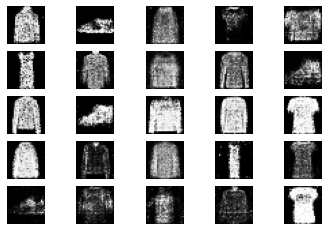

1/1 [==============================] - 0s 171ms/step
22601 [Discriminator loss: 0.650408, acc.: 68.75%] [Generator loss: 1.619416]
1/1 [==============================] - 0s 184ms/step
22602 [Discriminator loss: 0.525701, acc.: 70.31%] [Generator loss: 1.612093]
1/1 [==============================] - 0s 155ms/step
22603 [Discriminator loss: 0.488953, acc.: 73.44%] [Generator loss: 1.459108]
1/1 [==============================] - 0s 109ms/step
22604 [Discriminator loss: 0.473251, acc.: 78.12%] [Generator loss: 1.517002]
1/1 [==============================] - 0s 165ms/step
22605 [Discriminator loss: 0.467835, acc.: 73.44%] [Generator loss: 1.884914]
1/1 [==============================] - 0s 153ms/step
22606 [Discriminator loss: 0.376769, acc.: 82.81%] [Generator loss: 1.715573]
1/1 [==============================] - 0s 167ms/step
22607 [Discriminator loss: 0.525501, acc.: 71.88%] [Generator loss: 1.553543]
1/1 [==============================] - 0s 135ms/step
22608 [Discriminator loss: 0.4

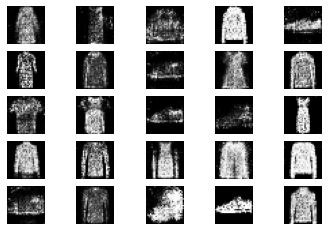

1/1 [==============================] - 0s 195ms/step
22801 [Discriminator loss: 0.469385, acc.: 82.81%] [Generator loss: 1.673732]
1/1 [==============================] - 0s 184ms/step
22802 [Discriminator loss: 0.304613, acc.: 87.50%] [Generator loss: 2.030017]
1/1 [==============================] - 0s 149ms/step
22803 [Discriminator loss: 0.447141, acc.: 78.12%] [Generator loss: 1.820378]
1/1 [==============================] - 0s 127ms/step
22804 [Discriminator loss: 0.505365, acc.: 78.12%] [Generator loss: 1.819019]
1/1 [==============================] - 0s 184ms/step
22805 [Discriminator loss: 0.415885, acc.: 85.94%] [Generator loss: 1.527334]
1/1 [==============================] - 0s 156ms/step
22806 [Discriminator loss: 0.393716, acc.: 84.38%] [Generator loss: 1.861954]
1/1 [==============================] - 0s 146ms/step
22807 [Discriminator loss: 0.450856, acc.: 76.56%] [Generator loss: 1.841104]
1/1 [==============================] - 0s 144ms/step
22808 [Discriminator loss: 0.4

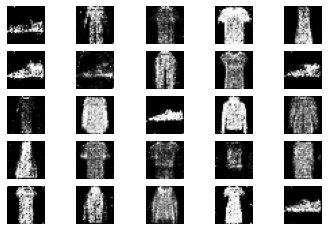

1/1 [==============================] - 0s 238ms/step
23001 [Discriminator loss: 0.510837, acc.: 78.12%] [Generator loss: 1.303616]
1/1 [==============================] - 0s 162ms/step
23002 [Discriminator loss: 0.505171, acc.: 76.56%] [Generator loss: 1.883254]
1/1 [==============================] - 0s 153ms/step
23003 [Discriminator loss: 0.459551, acc.: 75.00%] [Generator loss: 1.809259]
1/1 [==============================] - 0s 217ms/step
23004 [Discriminator loss: 0.480256, acc.: 73.44%] [Generator loss: 1.644928]
1/1 [==============================] - 0s 134ms/step
23005 [Discriminator loss: 0.592092, acc.: 65.62%] [Generator loss: 1.743709]
1/1 [==============================] - 0s 165ms/step
23006 [Discriminator loss: 0.495529, acc.: 71.88%] [Generator loss: 1.623454]
1/1 [==============================] - 0s 167ms/step
23007 [Discriminator loss: 0.541237, acc.: 71.88%] [Generator loss: 1.754216]
1/1 [==============================] - 0s 156ms/step
23008 [Discriminator loss: 0.3

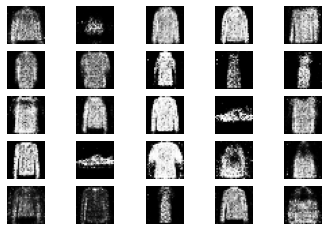

1/1 [==============================] - 0s 124ms/step
23201 [Discriminator loss: 0.438943, acc.: 82.81%] [Generator loss: 1.708972]
1/1 [==============================] - 0s 210ms/step
23202 [Discriminator loss: 0.472595, acc.: 76.56%] [Generator loss: 1.641725]
1/1 [==============================] - 0s 112ms/step
23203 [Discriminator loss: 0.499478, acc.: 78.12%] [Generator loss: 1.880934]
1/1 [==============================] - 0s 128ms/step
23204 [Discriminator loss: 0.373104, acc.: 81.25%] [Generator loss: 1.660793]
1/1 [==============================] - 0s 110ms/step
23205 [Discriminator loss: 0.481583, acc.: 81.25%] [Generator loss: 1.507215]
1/1 [==============================] - 0s 120ms/step
23206 [Discriminator loss: 0.456750, acc.: 81.25%] [Generator loss: 1.688542]
1/1 [==============================] - 0s 115ms/step
23207 [Discriminator loss: 0.334294, acc.: 87.50%] [Generator loss: 1.402994]
1/1 [==============================] - 0s 125ms/step
23208 [Discriminator loss: 0.4

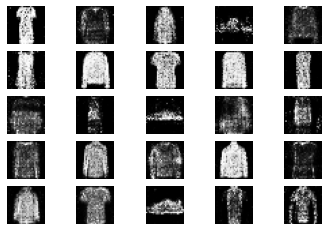

1/1 [==============================] - 0s 118ms/step
23401 [Discriminator loss: 0.459551, acc.: 81.25%] [Generator loss: 1.606719]
1/1 [==============================] - 0s 143ms/step
23402 [Discriminator loss: 0.380969, acc.: 84.38%] [Generator loss: 1.633103]
1/1 [==============================] - 0s 120ms/step
23403 [Discriminator loss: 0.573170, acc.: 68.75%] [Generator loss: 1.453028]
1/1 [==============================] - 0s 112ms/step
23404 [Discriminator loss: 0.550746, acc.: 76.56%] [Generator loss: 1.834280]
1/1 [==============================] - 0s 143ms/step
23405 [Discriminator loss: 0.500056, acc.: 76.56%] [Generator loss: 2.076149]
1/1 [==============================] - 0s 139ms/step
23406 [Discriminator loss: 0.349751, acc.: 82.81%] [Generator loss: 1.979824]
1/1 [==============================] - 0s 127ms/step
23407 [Discriminator loss: 0.478127, acc.: 75.00%] [Generator loss: 1.528626]
1/1 [==============================] - 0s 131ms/step
23408 [Discriminator loss: 0.4

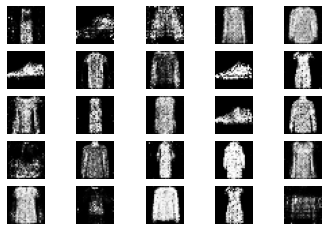

1/1 [==============================] - 0s 133ms/step
23601 [Discriminator loss: 0.490737, acc.: 75.00%] [Generator loss: 1.791343]
1/1 [==============================] - 0s 143ms/step
23602 [Discriminator loss: 0.466857, acc.: 81.25%] [Generator loss: 1.512563]
1/1 [==============================] - 0s 130ms/step
23603 [Discriminator loss: 0.586946, acc.: 67.19%] [Generator loss: 1.759342]
1/1 [==============================] - 0s 113ms/step
23604 [Discriminator loss: 0.327999, acc.: 84.38%] [Generator loss: 2.000932]
1/1 [==============================] - 0s 119ms/step
23605 [Discriminator loss: 0.436941, acc.: 79.69%] [Generator loss: 1.631475]
1/1 [==============================] - 0s 113ms/step
23606 [Discriminator loss: 0.468301, acc.: 75.00%] [Generator loss: 1.988086]
1/1 [==============================] - 0s 144ms/step
23607 [Discriminator loss: 0.428010, acc.: 84.38%] [Generator loss: 1.633763]
1/1 [==============================] - 0s 114ms/step
23608 [Discriminator loss: 0.5

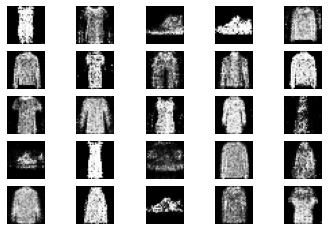

1/1 [==============================] - 0s 198ms/step
23801 [Discriminator loss: 0.731871, acc.: 64.06%] [Generator loss: 1.701995]
1/1 [==============================] - 0s 241ms/step
23802 [Discriminator loss: 0.367444, acc.: 82.81%] [Generator loss: 1.737003]
1/1 [==============================] - 0s 140ms/step
23803 [Discriminator loss: 0.637278, acc.: 70.31%] [Generator loss: 1.357716]
1/1 [==============================] - 0s 214ms/step
23804 [Discriminator loss: 0.384675, acc.: 85.94%] [Generator loss: 1.800576]
1/1 [==============================] - 0s 140ms/step
23805 [Discriminator loss: 0.450199, acc.: 79.69%] [Generator loss: 1.670563]
1/1 [==============================] - 0s 151ms/step
23806 [Discriminator loss: 0.567603, acc.: 68.75%] [Generator loss: 1.856624]
1/1 [==============================] - 0s 150ms/step
23807 [Discriminator loss: 0.397315, acc.: 90.62%] [Generator loss: 1.452277]
1/1 [==============================] - 0s 123ms/step
23808 [Discriminator loss: 0.4

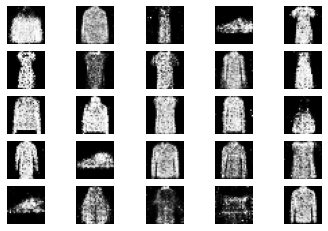

1/1 [==============================] - 0s 171ms/step
24001 [Discriminator loss: 0.569940, acc.: 68.75%] [Generator loss: 1.679680]
1/1 [==============================] - 0s 166ms/step
24002 [Discriminator loss: 0.425619, acc.: 81.25%] [Generator loss: 1.648362]
1/1 [==============================] - 0s 190ms/step
24003 [Discriminator loss: 0.525868, acc.: 75.00%] [Generator loss: 1.640428]
1/1 [==============================] - 0s 132ms/step
24004 [Discriminator loss: 0.432927, acc.: 73.44%] [Generator loss: 1.509159]
1/1 [==============================] - 0s 159ms/step
24005 [Discriminator loss: 0.374300, acc.: 87.50%] [Generator loss: 1.539648]
1/1 [==============================] - 0s 196ms/step
24006 [Discriminator loss: 0.497986, acc.: 73.44%] [Generator loss: 1.764611]
1/1 [==============================] - 0s 145ms/step
24007 [Discriminator loss: 0.442015, acc.: 71.88%] [Generator loss: 1.810715]
1/1 [==============================] - 0s 172ms/step
24008 [Discriminator loss: 0.4

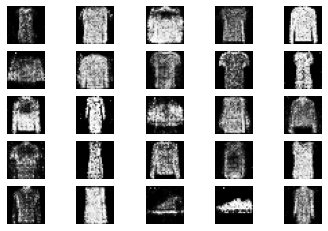

1/1 [==============================] - 0s 134ms/step
24201 [Discriminator loss: 0.429940, acc.: 78.12%] [Generator loss: 1.674098]
1/1 [==============================] - 0s 148ms/step
24202 [Discriminator loss: 0.509849, acc.: 71.88%] [Generator loss: 1.555175]
1/1 [==============================] - 0s 114ms/step
24203 [Discriminator loss: 0.452186, acc.: 75.00%] [Generator loss: 1.453836]
1/1 [==============================] - 0s 243ms/step
24204 [Discriminator loss: 0.436192, acc.: 82.81%] [Generator loss: 1.722179]
1/1 [==============================] - 0s 110ms/step
24205 [Discriminator loss: 0.336895, acc.: 87.50%] [Generator loss: 1.751612]
1/1 [==============================] - 0s 117ms/step
24206 [Discriminator loss: 0.512051, acc.: 73.44%] [Generator loss: 1.776920]
1/1 [==============================] - 0s 123ms/step
24207 [Discriminator loss: 0.535339, acc.: 78.12%] [Generator loss: 1.788773]
1/1 [==============================] - 0s 142ms/step
24208 [Discriminator loss: 0.4

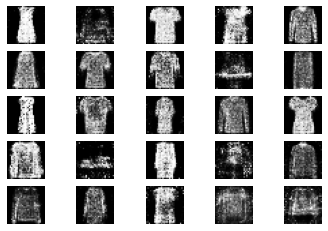

1/1 [==============================] - 0s 132ms/step
24401 [Discriminator loss: 0.518410, acc.: 75.00%] [Generator loss: 1.562203]
1/1 [==============================] - 0s 150ms/step
24402 [Discriminator loss: 0.513962, acc.: 68.75%] [Generator loss: 1.476526]
1/1 [==============================] - 0s 135ms/step
24403 [Discriminator loss: 0.448045, acc.: 81.25%] [Generator loss: 1.950995]
1/1 [==============================] - 0s 143ms/step
24404 [Discriminator loss: 0.436118, acc.: 84.38%] [Generator loss: 1.494438]
1/1 [==============================] - 0s 157ms/step
24405 [Discriminator loss: 0.451432, acc.: 79.69%] [Generator loss: 1.687707]
1/1 [==============================] - 0s 145ms/step
24406 [Discriminator loss: 0.473155, acc.: 78.12%] [Generator loss: 1.462733]
1/1 [==============================] - 0s 181ms/step
24407 [Discriminator loss: 0.559677, acc.: 73.44%] [Generator loss: 1.410065]
1/1 [==============================] - 0s 105ms/step
24408 [Discriminator loss: 0.5

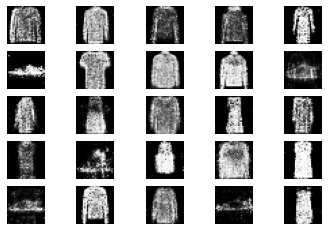

1/1 [==============================] - 0s 136ms/step
24601 [Discriminator loss: 0.498525, acc.: 71.88%] [Generator loss: 1.870322]
1/1 [==============================] - 0s 145ms/step
24602 [Discriminator loss: 0.374038, acc.: 81.25%] [Generator loss: 1.852693]
1/1 [==============================] - 0s 135ms/step
24603 [Discriminator loss: 0.421823, acc.: 81.25%] [Generator loss: 1.676650]
1/1 [==============================] - 0s 184ms/step
24604 [Discriminator loss: 0.519899, acc.: 76.56%] [Generator loss: 1.590277]
1/1 [==============================] - 0s 189ms/step
24605 [Discriminator loss: 0.445893, acc.: 79.69%] [Generator loss: 1.743494]
1/1 [==============================] - 0s 154ms/step
24606 [Discriminator loss: 0.563814, acc.: 64.06%] [Generator loss: 1.636484]
1/1 [==============================] - 0s 128ms/step
24607 [Discriminator loss: 0.256901, acc.: 92.19%] [Generator loss: 1.593971]
1/1 [==============================] - 0s 170ms/step
24608 [Discriminator loss: 0.4

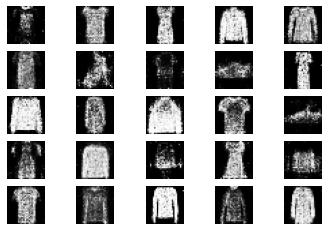

1/1 [==============================] - 0s 160ms/step
24801 [Discriminator loss: 0.418712, acc.: 82.81%] [Generator loss: 1.485778]
1/1 [==============================] - 0s 141ms/step
24802 [Discriminator loss: 0.449060, acc.: 81.25%] [Generator loss: 2.005160]
1/1 [==============================] - 0s 140ms/step
24803 [Discriminator loss: 0.477337, acc.: 75.00%] [Generator loss: 1.947206]
1/1 [==============================] - 0s 155ms/step
24804 [Discriminator loss: 0.450779, acc.: 79.69%] [Generator loss: 1.486027]
1/1 [==============================] - 0s 150ms/step
24805 [Discriminator loss: 0.470283, acc.: 76.56%] [Generator loss: 1.293187]
1/1 [==============================] - 0s 193ms/step
24806 [Discriminator loss: 0.417209, acc.: 84.38%] [Generator loss: 1.638376]
1/1 [==============================] - 0s 245ms/step
24807 [Discriminator loss: 0.422065, acc.: 82.81%] [Generator loss: 1.544213]
1/1 [==============================] - 0s 119ms/step
24808 [Discriminator loss: 0.4

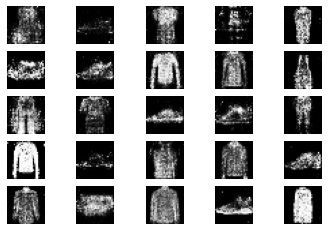

1/1 [==============================] - 0s 214ms/step
25001 [Discriminator loss: 0.464827, acc.: 76.56%] [Generator loss: 1.640145]
1/1 [==============================] - 0s 162ms/step
25002 [Discriminator loss: 0.542530, acc.: 71.88%] [Generator loss: 1.819125]
1/1 [==============================] - 0s 124ms/step
25003 [Discriminator loss: 0.328721, acc.: 89.06%] [Generator loss: 1.885760]
1/1 [==============================] - 0s 174ms/step
25004 [Discriminator loss: 0.542414, acc.: 73.44%] [Generator loss: 2.006371]
1/1 [==============================] - 0s 120ms/step
25005 [Discriminator loss: 0.381105, acc.: 79.69%] [Generator loss: 1.875949]
1/1 [==============================] - 0s 137ms/step
25006 [Discriminator loss: 0.573486, acc.: 71.88%] [Generator loss: 1.463987]
1/1 [==============================] - 0s 122ms/step
25007 [Discriminator loss: 0.489132, acc.: 75.00%] [Generator loss: 1.447291]
1/1 [==============================] - 0s 201ms/step
25008 [Discriminator loss: 0.4

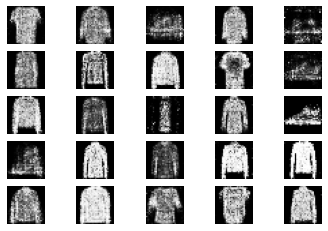

1/1 [==============================] - 0s 193ms/step
25201 [Discriminator loss: 0.578124, acc.: 70.31%] [Generator loss: 1.896804]
1/1 [==============================] - 0s 209ms/step
25202 [Discriminator loss: 0.547422, acc.: 75.00%] [Generator loss: 1.653152]
1/1 [==============================] - 0s 114ms/step
25203 [Discriminator loss: 0.461250, acc.: 85.94%] [Generator loss: 1.940976]
1/1 [==============================] - 0s 133ms/step
25204 [Discriminator loss: 0.444782, acc.: 76.56%] [Generator loss: 1.721682]
1/1 [==============================] - 0s 117ms/step
25205 [Discriminator loss: 0.383273, acc.: 85.94%] [Generator loss: 1.515873]
1/1 [==============================] - 0s 163ms/step
25206 [Discriminator loss: 0.426234, acc.: 79.69%] [Generator loss: 1.639981]
1/1 [==============================] - 0s 123ms/step
25207 [Discriminator loss: 0.464132, acc.: 73.44%] [Generator loss: 1.461499]
1/1 [==============================] - 0s 149ms/step
25208 [Discriminator loss: 0.4

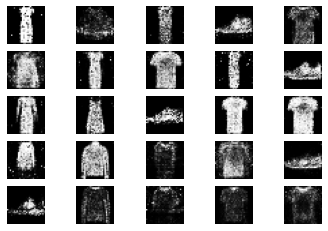

1/1 [==============================] - 0s 133ms/step
25401 [Discriminator loss: 0.423420, acc.: 78.12%] [Generator loss: 1.735010]
1/1 [==============================] - 0s 150ms/step
25402 [Discriminator loss: 0.409593, acc.: 82.81%] [Generator loss: 1.751284]
1/1 [==============================] - 0s 145ms/step
25403 [Discriminator loss: 0.433080, acc.: 75.00%] [Generator loss: 1.960832]
1/1 [==============================] - 0s 137ms/step
25404 [Discriminator loss: 0.375408, acc.: 85.94%] [Generator loss: 1.657580]
1/1 [==============================] - 0s 153ms/step
25405 [Discriminator loss: 0.440669, acc.: 78.12%] [Generator loss: 1.434919]
1/1 [==============================] - 0s 128ms/step
25406 [Discriminator loss: 0.449264, acc.: 76.56%] [Generator loss: 1.703688]
1/1 [==============================] - 0s 160ms/step
25407 [Discriminator loss: 0.461786, acc.: 81.25%] [Generator loss: 1.745559]
1/1 [==============================] - 0s 161ms/step
25408 [Discriminator loss: 0.4

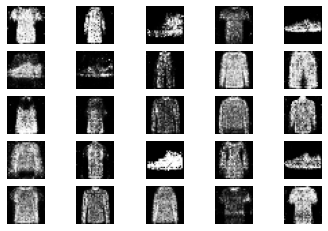

1/1 [==============================] - 0s 153ms/step
25601 [Discriminator loss: 0.367517, acc.: 84.38%] [Generator loss: 1.831039]
1/1 [==============================] - 0s 164ms/step
25602 [Discriminator loss: 0.428647, acc.: 79.69%] [Generator loss: 1.547509]
1/1 [==============================] - 0s 145ms/step
25603 [Discriminator loss: 0.370576, acc.: 84.38%] [Generator loss: 1.676731]
1/1 [==============================] - 0s 139ms/step
25604 [Discriminator loss: 0.369159, acc.: 87.50%] [Generator loss: 2.024374]
1/1 [==============================] - 0s 138ms/step
25605 [Discriminator loss: 0.470687, acc.: 75.00%] [Generator loss: 1.649062]
1/1 [==============================] - 0s 215ms/step
25606 [Discriminator loss: 0.470200, acc.: 73.44%] [Generator loss: 1.669355]
1/1 [==============================] - 0s 127ms/step
25607 [Discriminator loss: 0.499900, acc.: 81.25%] [Generator loss: 1.795315]
1/1 [==============================] - 0s 155ms/step
25608 [Discriminator loss: 0.5

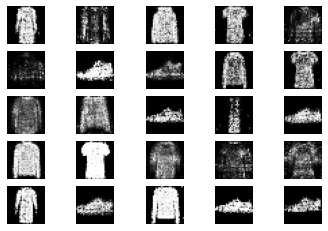

1/1 [==============================] - 0s 204ms/step
25801 [Discriminator loss: 0.451761, acc.: 82.81%] [Generator loss: 1.820220]
1/1 [==============================] - 0s 256ms/step
25802 [Discriminator loss: 0.415035, acc.: 78.12%] [Generator loss: 1.942537]
1/1 [==============================] - 0s 213ms/step
25803 [Discriminator loss: 0.443573, acc.: 78.12%] [Generator loss: 2.027005]
1/1 [==============================] - 0s 216ms/step
25804 [Discriminator loss: 0.514064, acc.: 76.56%] [Generator loss: 1.889035]
1/1 [==============================] - 0s 230ms/step
25805 [Discriminator loss: 0.390084, acc.: 87.50%] [Generator loss: 1.679905]
1/1 [==============================] - 0s 205ms/step
25806 [Discriminator loss: 0.423797, acc.: 81.25%] [Generator loss: 1.500174]
1/1 [==============================] - 0s 240ms/step
25807 [Discriminator loss: 0.466210, acc.: 76.56%] [Generator loss: 1.637989]
1/1 [==============================] - 0s 217ms/step
25808 [Discriminator loss: 0.4

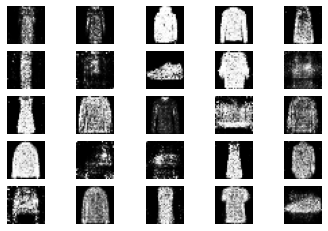

1/1 [==============================] - 0s 357ms/step
26001 [Discriminator loss: 0.389053, acc.: 84.38%] [Generator loss: 1.757444]
1/1 [==============================] - 0s 368ms/step
26002 [Discriminator loss: 0.486841, acc.: 76.56%] [Generator loss: 1.653237]
1/1 [==============================] - 0s 309ms/step
26003 [Discriminator loss: 0.531500, acc.: 71.88%] [Generator loss: 1.848081]
1/1 [==============================] - 0s 254ms/step
26004 [Discriminator loss: 0.423858, acc.: 81.25%] [Generator loss: 1.783606]
1/1 [==============================] - 0s 264ms/step
26005 [Discriminator loss: 0.458317, acc.: 76.56%] [Generator loss: 2.016146]
1/1 [==============================] - 0s 333ms/step
26006 [Discriminator loss: 0.471527, acc.: 76.56%] [Generator loss: 1.793081]
1/1 [==============================] - 0s 393ms/step
26007 [Discriminator loss: 0.555558, acc.: 67.19%] [Generator loss: 2.023562]
1/1 [==============================] - 0s 315ms/step
26008 [Discriminator loss: 0.4

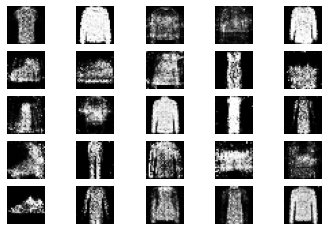

1/1 [==============================] - 0s 184ms/step
26201 [Discriminator loss: 0.445408, acc.: 81.25%] [Generator loss: 1.527008]
1/1 [==============================] - 0s 232ms/step
26202 [Discriminator loss: 0.422076, acc.: 82.81%] [Generator loss: 1.523906]
1/1 [==============================] - 0s 216ms/step
26203 [Discriminator loss: 0.468636, acc.: 76.56%] [Generator loss: 1.601951]
1/1 [==============================] - 0s 169ms/step
26204 [Discriminator loss: 0.570012, acc.: 73.44%] [Generator loss: 1.838065]
1/1 [==============================] - 0s 185ms/step
26205 [Discriminator loss: 0.456558, acc.: 82.81%] [Generator loss: 1.861701]
1/1 [==============================] - 0s 169ms/step
26206 [Discriminator loss: 0.572753, acc.: 73.44%] [Generator loss: 1.770523]
1/1 [==============================] - 0s 184ms/step
26207 [Discriminator loss: 0.551446, acc.: 71.88%] [Generator loss: 1.791653]
1/1 [==============================] - 0s 192ms/step
26208 [Discriminator loss: 0.3

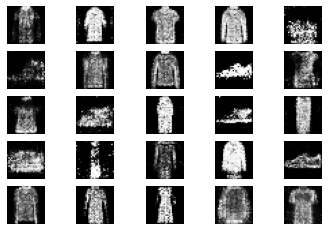

1/1 [==============================] - 0s 163ms/step
26401 [Discriminator loss: 0.594347, acc.: 73.44%] [Generator loss: 1.716692]
1/1 [==============================] - 0s 194ms/step
26402 [Discriminator loss: 0.393650, acc.: 81.25%] [Generator loss: 1.775562]
1/1 [==============================] - 0s 170ms/step
26403 [Discriminator loss: 0.482550, acc.: 84.38%] [Generator loss: 1.597955]
1/1 [==============================] - 0s 196ms/step
26404 [Discriminator loss: 0.484185, acc.: 79.69%] [Generator loss: 1.786723]
1/1 [==============================] - 0s 226ms/step
26405 [Discriminator loss: 0.374837, acc.: 81.25%] [Generator loss: 1.679056]
1/1 [==============================] - 0s 177ms/step
26406 [Discriminator loss: 0.372245, acc.: 87.50%] [Generator loss: 1.639159]
1/1 [==============================] - 0s 176ms/step
26407 [Discriminator loss: 0.346128, acc.: 89.06%] [Generator loss: 2.144728]
1/1 [==============================] - 0s 173ms/step
26408 [Discriminator loss: 0.3

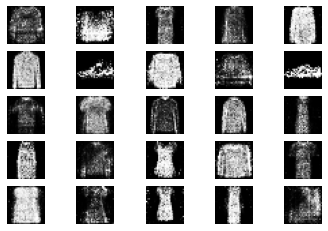

1/1 [==============================] - 0s 161ms/step
26601 [Discriminator loss: 0.445954, acc.: 78.12%] [Generator loss: 2.003919]
1/1 [==============================] - 0s 271ms/step
26602 [Discriminator loss: 0.435794, acc.: 81.25%] [Generator loss: 1.930518]
1/1 [==============================] - 0s 282ms/step
26603 [Discriminator loss: 0.419864, acc.: 82.81%] [Generator loss: 1.777529]
1/1 [==============================] - 0s 186ms/step
26604 [Discriminator loss: 0.473681, acc.: 78.12%] [Generator loss: 1.839746]
1/1 [==============================] - 0s 196ms/step
26605 [Discriminator loss: 0.388651, acc.: 79.69%] [Generator loss: 1.973575]
1/1 [==============================] - 0s 187ms/step
26606 [Discriminator loss: 0.469325, acc.: 79.69%] [Generator loss: 2.019434]
1/1 [==============================] - 0s 160ms/step
26607 [Discriminator loss: 0.374018, acc.: 82.81%] [Generator loss: 1.836718]
1/1 [==============================] - 0s 185ms/step
26608 [Discriminator loss: 0.4

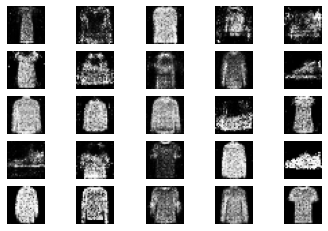

1/1 [==============================] - 0s 162ms/step
26801 [Discriminator loss: 0.439077, acc.: 76.56%] [Generator loss: 1.741216]
1/1 [==============================] - 0s 176ms/step
26802 [Discriminator loss: 0.579314, acc.: 65.62%] [Generator loss: 1.593234]
1/1 [==============================] - 0s 200ms/step
26803 [Discriminator loss: 0.559279, acc.: 75.00%] [Generator loss: 1.865145]
1/1 [==============================] - 0s 184ms/step
26804 [Discriminator loss: 0.484509, acc.: 78.12%] [Generator loss: 1.634858]
1/1 [==============================] - 0s 177ms/step
26805 [Discriminator loss: 0.640639, acc.: 62.50%] [Generator loss: 1.723955]
1/1 [==============================] - 0s 170ms/step
26806 [Discriminator loss: 0.401816, acc.: 81.25%] [Generator loss: 1.676400]
1/1 [==============================] - 0s 208ms/step
26807 [Discriminator loss: 0.481116, acc.: 76.56%] [Generator loss: 1.850500]
1/1 [==============================] - 0s 180ms/step
26808 [Discriminator loss: 0.4

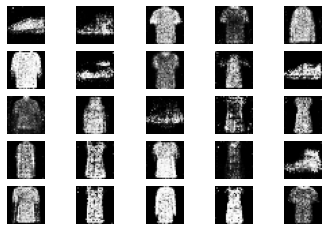

1/1 [==============================] - 0s 192ms/step
27001 [Discriminator loss: 0.413582, acc.: 85.94%] [Generator loss: 2.024980]
1/1 [==============================] - 0s 179ms/step
27002 [Discriminator loss: 0.450172, acc.: 79.69%] [Generator loss: 1.972815]
1/1 [==============================] - 0s 209ms/step
27003 [Discriminator loss: 0.492308, acc.: 71.88%] [Generator loss: 2.123377]
1/1 [==============================] - 0s 321ms/step
27004 [Discriminator loss: 0.384927, acc.: 84.38%] [Generator loss: 1.866698]
1/1 [==============================] - 0s 195ms/step
27005 [Discriminator loss: 0.467881, acc.: 78.12%] [Generator loss: 1.727258]
1/1 [==============================] - 0s 178ms/step
27006 [Discriminator loss: 0.419588, acc.: 75.00%] [Generator loss: 1.381750]
1/1 [==============================] - 0s 264ms/step
27007 [Discriminator loss: 0.544479, acc.: 78.12%] [Generator loss: 1.409077]
1/1 [==============================] - 0s 310ms/step
27008 [Discriminator loss: 0.5

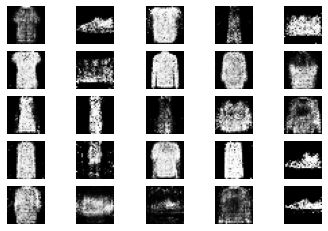

1/1 [==============================] - 0s 225ms/step
27201 [Discriminator loss: 0.387786, acc.: 75.00%] [Generator loss: 1.626643]
1/1 [==============================] - 0s 189ms/step
27202 [Discriminator loss: 0.437096, acc.: 79.69%] [Generator loss: 2.065217]
1/1 [==============================] - 0s 195ms/step
27203 [Discriminator loss: 0.416463, acc.: 82.81%] [Generator loss: 1.945563]
1/1 [==============================] - 0s 207ms/step
27204 [Discriminator loss: 0.399622, acc.: 81.25%] [Generator loss: 1.835452]
1/1 [==============================] - 0s 224ms/step
27205 [Discriminator loss: 0.466940, acc.: 81.25%] [Generator loss: 1.840032]
1/1 [==============================] - 0s 195ms/step
27206 [Discriminator loss: 0.493352, acc.: 76.56%] [Generator loss: 1.763378]
1/1 [==============================] - 0s 194ms/step
27207 [Discriminator loss: 0.416112, acc.: 78.12%] [Generator loss: 2.022864]
1/1 [==============================] - 0s 211ms/step
27208 [Discriminator loss: 0.4

In [12]:
# train(generator,discriminator,gan_model,epochs=30000, batch_size=32, sample_interval=200)
train(generator,discriminator,gan_model,epochs=30000, batch_size=32, sample_interval=200)

